



# **STOCK ENTRY/EXIT PREDICTION**


---












# **Business Objective**


---


There have been surge in people investing in stock from last few years and specially when people can invest from our their own smartphone, they have started understanding the importance of investment whether its stocks, real estate or metals.

Lots of people who do not know much about how stocks behave or at what time they should buy/sell a particular stock keeping the risk involved in mind, a Recommendation model can help them to choose the right stock.

A Model which can recommend users what to buy or what to sell in real time is our Business Objective.

**Constraints**


---


1.Low Latency(In Real time within in few nano seconds the model should be able to classify the stocks according to the market )

2.Errors can be very costly, people can loose their money by one wrong prediction though the model can't be 100% accurate.

3.Interpretablity is important.

4.Probablity of a particular stock belonging to each class is needed.

**Machine Learning Formulation**


---



This Recommendation model should classify a particular stock, whether its a "STRONG_BUY" "STRONG_SELL" "BUY" "SELL" "HOLD".

The major challenge of this classification problem is imabalance natures of class labels, most of times user has to HOLD the stocks and very few times STRONG BUY and STRONG SELL Signal is there.

**DATA**


---



Scraped data for 64 US Companies from Yahoo Finance website, initially data has 41k rows and 67 features, Recommendation column has been added to data as the target class, This Recommendation column was calculated using domain knowledge of stock market(from some rule based system) and also from manual observation.

**PERFORMANCE METRIC**


---




It is a simple multiclass classification problem, we can just use Multi-Class log loss for checking the performance.

Other than that we will use accuracy(after checking if data is balanced or not), here the important thing is we care equally about Precision and Recall because we care equall about False Positives and False Negatives.

**Example1**

 Let's say we have a case when actually stock is "NOT A STRONG SELL" at that moment and model predicted it to be "STRONG SELL", here user will sell the stocks and after some time price of that stock rises and user won't be happy with the model and he/she might not use it afterwards. This is a case of False Positive.

**Example2**

let's say we have a case when actually stock is a "STRONG SELL" at the moment and model predicted it to be "NOT A STRONG SELL", Now in this case user can loose money because trend may change after some time and stocks price will decrease, User will definitely won't use the model. This is the case of False Negative.

So the best perfomance metric would be F1 score because F1 score is the harmonic mean between precision and recall and it will be high when both precision and recall will be high.



In [200]:
#importing the libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.utils import class_weight
import warnings
warnings.filterwarnings("ignore")
import imblearn


In [39]:
#loading the data
data=pd.read_csv("/content/drive/MyDrive/2yrs_stock_history.csv")

In [40]:
#shape of data
data.shape

(41070, 68)

In [41]:
#companies we have in the dataset
companies=data['Stock'].unique()
print(companies)

['ENOB' 'BSET' 'PLTR' 'TRNS' 'NVAX' 'COGT' 'VXRT' 'PACB' 'SQ' 'IBN' 'GCO'
 'INO' 'OMI' 'FSLY' 'BCRX' 'CERS' 'AA' 'PRTK' 'OCGN' 'TDOC' 'ARCB' 'JBL'
 'DKS' 'CONN' 'BCTX' 'PLT' 'APT' 'BVS' 'TWLO' 'STLA' 'INFY' 'MSFT' 'OGI'
 'SURF' 'HSIC' 'AYX' 'AAPL' 'EVAX' 'ZS' 'MRNA' 'PVH' 'PLAN' 'VRTX' 'TSLA'
 'GTBP' 'CODX' 'FB' 'PYPL' 'LC' 'AMZN' 'BILL' 'DSY' 'SHOP' 'SE' 'Z' 'BABA'
 'COIN' 'INTU' 'WDAY' 'DOCU' 'PATH' 'ICE' 'OPEN' 'JD']


In [42]:
data.describe() 
# # we will see here the mean, median, percentiles for all the coulmns

,Close,Change,Change%,ADX,ADX_Change%,DI+,DI-,ADX_Histogram,William%R,RSI,MFI,%K(Smooth),%D(Smooth),MACD,Signal,Histogram,52wLow,52wHigh,%Above_52wLow,%Below_52wHigh,Open,High,Low,20dma,50dma,130dma,150dma,200dma,%50dma/200dma,Volume,10d_Average_Volume,3m_Average_Volume,10d_vs_3months_Volume%,20d_Average_Volume,PreviousWeeks_20d_Average_Volume,Change%Over4weeks,Change%Over12weeks
count,41070.000000,41061.000000,41061.000000,41054.000000,41046.000000,41070.000000,41070.000000,41070.000000,40965.000000,41070.000000,40965.000000,40949.000000,40933.000000,41070.000000,41070.000000,41070.000000,41070.000000,41070.000000,41070.000000,41070.000000,41070.000000,41070.000000,41070.000000,40917.000000,40653.000000,39858.000000,39698.000000,39170.000000,39170.000000,4.107000e+04,4.099700e+04,4.053300e+04,40533.000000,4.091700e+04,4.087700e+04,40909.000000,40521.000000
mean,118.049493,0.196934,0.335916,25.641208,0.067539,25.698588,21.700159,3.998429,-47.063865,52.664476,54.744454,52.980445,53.033716,1.352711,1.335136,0.017576,57.899424,143.096513,259.698262,30.091379,118.054127,120.237241,115.730438,116.056629,113.606074,107.815076,106.160664,102.472456,13.064543,8.800470e+06,8.763346e+06,8.667119e+06,4.143611,8.750186e+06,8.735518e+06,7.409304,26.563350
std,326.844795,8.107791,6.446634,10.949844,4.767611,9.025376,8.123922,15.030839,29.976093,12.749042,17.331158,27.970418,27.165913,8.318564,7.728331,2.623874,199.917446,358.211873,574.235204,25.404557,326.695956,331.068407,322.290932,317.090993,311.766009,298.512024,294.696406,285.394186,37.806420,2.494991e+07,2.119913e+07,1.946494e+07,53.926209,2.037388e+07,2.038121e+07,38.586503,142.531969
min,0.200000,-187.960000,-70.680000,6.520000,-7.140000,0.000000,0.000000,-54.510000,-100.000000,0.000000,0.000000,0.000000,0.000000,-70.860000,-51.600000,-50.350000,0.170000,0.960000,0.000000,0.000000,0.200000,0.200000,0.170000,0.220000,0.260000,0.330000,0.330000,0.330000,-93.700000,0.000000e+00,1.590000e+01,7.383000e+01,-95.220000,6.400000e+01,6.200000e+01,-91.180000,-98.120000
25%,10.030000,-0.510000,-1.910000,17.470000,-3.640000,19.420000,16.060000,-5.687500,-74.020000,44.210000,42.730000,27.730000,28.570000,-0.280000,-0.250000,-0.200000,3.700000,18.470000,40.162500,8.540000,10.040000,10.370000,9.700000,10.070000,10.040000,10.020000,10.090000,10.240000,-8.050000,9.436000e+05,1.091310e+06,1.222665e+06,-25.260000,1.161312e+06,1.156430e+06,-6.900000,-9.990000
50%,35.155000,0.010000,0.030000,23.350000,-0.400000,24.930000,20.960000,3.790000,-45.340000,52.595000,55.590000,55.120000,55.240000,0.190000,0.190000,0.010000,14.070000,50.730000,97.050000,23.750000,35.130000,35.980000,34.235000,34.540000,33.770000,32.620000,32.470000,32.610000,8.690000,2.331300e+06,2.541170e+06,2.605077e+06,-7.280000,2.589115e+06,2.573670e+06,3.200000,8.670000
75%,117.237500,0.720000,2.110000,31.717500,2.960000,30.950000,26.450000,13.780000,-19.770000,61.350000,67.500000,78.710000,78.000000,1.560000,1.500000,0.280000,48.570000,151.000000,246.417500,45.600000,117.410000,119.740000,114.540000,116.320000,114.560000,109.215000,107.750000,104.030000,28.820000,6.565850e+06,7.111050e+06,7.538545e+06,17.940000,7.439475e+06,7.417095e+06,14.380000,31.530000
max,12529.000000,234.870000,394.380000,100.000000,50.000000,93.310000,74.970000,92.010000,0.000000,100.000000,100.000000,100.000000,100.000000,162.690000,139.250000,51.020000,12203.000000,12650.000000,9200.000000,99.230000,12203.000000,12650.000000,12203.000000,3562.250000,3386.780000,3287.630000,3276.210000,3253.270000,239.260000,9.181943e+08,3.337356e+08,2.137677e+08,494.550000,3.102953e+08,3.102953e+08,923.330000,5000.000000


In [43]:
#let's check if there is any duplicate data
print(data.duplicated().any())
print(data.duplicated().sum())

True
11770


In [44]:
#let's drop all the duplicates values
data.drop_duplicates(inplace=True)

In [45]:
data.shape

(29300, 68)

Now we got around 29300 rows with 68 columns

In [46]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29300 entries, 0 to 41069
Data columns (total 68 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Date                                  29300 non-null  object 
 1   Stock                                 29300 non-null  object 
 2   Close                                 29300 non-null  float64
 3   Change                                29292 non-null  float64
 4   Change%                               29292 non-null  float64
 5   Recommendation                        6169 non-null   object 
 6   Observation                           22593 non-null  object 
 7   MarketType                            29286 non-null  object 
 8   ADX                                   29286 non-null  float64
 9   ADX_Change%                           29279 non-null  float64
 10  ADX_Strength                          28934 non-null  object 
 11  ADX_Interpretat

There are null values in the data, let's get deep into the data.

In [47]:
# we have Recommendation feature as a target variable, now lets impute 
# missing values
print(data['Recommendation'].isnull().sum())
#empty values here that the user should hold the stocks.
#lets will the empty values with "Hold"
data['Recommendation']=data["Recommendation"].fillna("Hold")

23131


In [48]:
print(data['Recommendation'].isnull().sum())
#now we dont have any null value

0


Hold           23131
Sell            2624
Buy             1770
Strong Sell     1002
Strong Buy       773
Name: Recommendation, dtype: int64


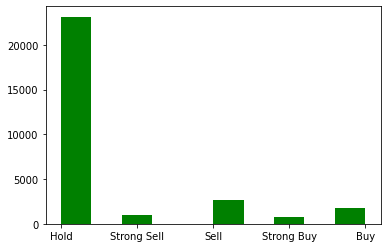

In [49]:
#Recommendation is our target variable
#Lets see if there is class imbalace or not

print(data['Recommendation'].value_counts())
plt.hist(data['Recommendation'], facecolor='g')
plt.show()

Above plot shows that in last 2 years,among 64 listed companies there have been only 701 instances where there is a StrongBuy condition, there have been only 935 times when strong sell condition happen, Buy happened 1642 times, Sell happened 2430 times, and Hold occurs 21358 times. We can observe that there is a class imbalance in data.

In [50]:
#lets see this imbalance data in depth
#CLASS LABELS PERCENTAGE In WHOLE DATA
a=2624/data.shape[0]*100 #sell
b=1770/data.shape[0]*100 #buy
c=1002/data.shape[0]*100 #strong sell
d=773/data.shape[0]*100 #strong buy
e=23131/data.shape[0]*100 #hold
print("Percenatage of Sell in data " +str(a)+"%")
print("Percenatage of Buy in data " +str(b)+"%")
print("Percenatage of Strong Sell in data " +str(c)+"%")
print("Percenatage of Strong Buy in data " +str(d)+"%")
print("Percentage of Hold in data " +str(e)+"%")

Percenatage of Sell in data 8.955631399317406%
Percenatage of Buy in data 6.040955631399317%
Percenatage of Strong Sell in data 3.4197952218430037%
Percenatage of Strong Buy in data 2.638225255972696%
Percentage of Hold in data 78.94539249146759%


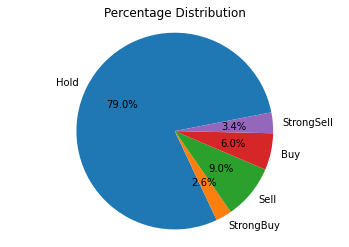

In [51]:
#LETS PLOT THE PIE CHART TO SEE THE DISTRIBUTION
label = 'Hold','StrongBuy','Sell','Buy','StrongSell'
percent = [ 78.9, 2.63,8.95,6.04,3.41 ]

fig1, ax1 = plt.subplots()
ax1.pie(percent ,labels=label, autopct='%1.1f%%',
        shadow=False, startangle=11)
ax1.axis('equal')  
plt.title("Percentage Distribution")
plt.show()

Ideally Hold must be 40%, Sell and Buy must be 20% each, StrongSell and StrongBuy must be 10% each. Let's try to balance the class labels

First method we can try is to eliminate all the rows which does not have any observation value, rows which does not have any observation are rows where rule based system provided all the indicators could not come up with any reason behind the recommendation.

In [52]:
data['Observation'].describe()

count                                                 22593
unique                                                  291
top       Volume>=10d_Average_Volume;Volume>=3m_Average_...
freq                                                   2532
Name: Observation, dtype: object

In [53]:
data['Observation'].isnull().sum()

6707

In [54]:
#removing all the rows where observation is null
data=data[data['Observation'].notna()]

In [55]:
#new shape of the data
data.shape

(22593, 68)

Hold           16424
Sell            2624
Buy             1770
Strong Sell     1002
Strong Buy       773
Name: Recommendation, dtype: int64


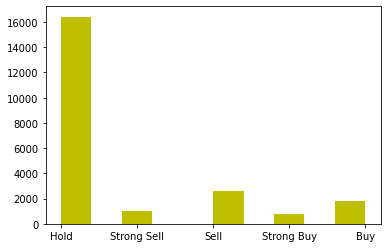

In [56]:
#lets check the percentage of class labels in modified dataframe
print(data['Recommendation'].value_counts())
plt.hist(data['Recommendation'], facecolor='y')
plt.show() 

In [57]:
#lets see this imbalance data in depth
#CLASS LABELS PERCENTAGE In WHOLE DATA
a=2624/data.shape[0]*100 #sell
b=1770/data.shape[0]*100 #buy
c=1002/data.shape[0]*100 #strong sell
d=773/data.shape[0]*100 #strong buy
e=16424/data.shape[0]*100 #hold
print("Percenatage of Sell in data " +str(a)+"%")
print("Percenatage of Buy in data " +str(b)+"%")
print("Percenatage of Strong Sell in data " +str(c)+"%")
print("Percenatage of Strong Buy in data " +str(d)+"%")
print("Percentage of Hold in data " +str(e)+"%")

Percenatage of Sell in data 11.614216792811934%
Percenatage of Buy in data 7.834284955517195%
Percenatage of Strong Sell in data 4.435001991767361%
Percenatage of Strong Buy in data 3.4214137122117467%
Percentage of Hold in data 72.69508254769175%


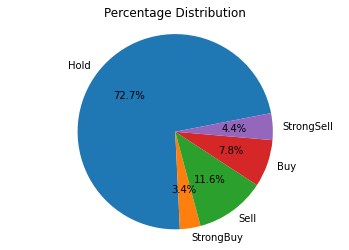

In [58]:
#LETS PLOT THE PIE CHART TO SEE THE DISTRIBUTION
label = 'Hold','StrongBuy','Sell','Buy','StrongSell'
percent = [ 72.69, 3.42,11.61,7.83,4.43 ]

fig1, ax1 = plt.subplots()
ax1.pie(percent ,labels=label, autopct='%1.1f%%',
        shadow=False, startangle=11)
ax1.axis('equal')  
plt.title("Percentage Distribution")
plt.show()

We got some positive changes in the distribution of class labels but still classes are highly imbalanced.

---



---



One another method which we can try is to downsample the hold values from the row
but that will cost us data shortage.

3rd technique would be to upsample the other class labels, that will solve the problem of class imbalance and also will increase the data rows but like any other thing, it also has a disadvantage whichs is...

In real world, most times we have to "HOLD" the stock compared to "SELL",
"BUY" etc, now here we can frame data like the way we want but again model 
has to deal with real time situations and thats where it may fail at 
somepoints

What we can do is, we can upsample a particular class label to it's ideal 
value which is "SELL" -- 20% , "BUY"--"20%", "STRONG SELL"--"10%",
"STRONG BUY"--"10%"

---



---



# **Exploratory Data Analysis**

1. We will explore the data here and see what story data tells us about the stocks.

2. We will check for null values and try to impute them.

3. We will check each and every feature and see whether it is useful to us or not.

4. We will plot various plot to understand the relationship between different features.

5. We will do univariate and bivariate analysis.

6. We will check whther there is a correlation between data or not.

7. We will check for outliers



In [59]:
# feature names in our data
data.columns

Index(['Date', 'Stock', 'Close', 'Change', 'Change%', 'Recommendation',
       'Observation', 'MarketType', 'ADX', 'ADX_Change%', 'ADX_Strength',
       'ADX_Interpretation', 'DI+', 'DI-', 'ADX_Histogram', 'William%R',
       'William%R_Interpretation', 'RSI', 'RSI_Interpretation', 'MFI',
       'MFI_Interpretation', '%K(Smooth)', '%D(Smooth)',
       'Stochastic_Interpretation', 'MACD', 'Signal', 'Histogram',
       'Histogram_Interpretation', 'Histogram_Interpretation_previousday',
       'MACD_Change%', '52wLow', '52wHigh', '%Above_52wLow', '%Below_52wHigh',
       'Open', 'High', 'Low', 'Close>=50dma>=150dma>=200dma',
       '50dma>=150dma>=200dma', 'Close>=50dma', 'Close>=150dma',
       'Close>=200dma', '50dma>=150dma', '150dma>=200dma', '20dma', '50dma',
       '130dma', '150dma', '200dma', '%50dma/200dma', 'Volume',
       '10d_Average_Volume', '3m_Average_Volume', '10d_vs_3months_Volume%',
       'Volume>=10d_Average_Volume', 'Volume>=3m_Average_Volume',
       'CandleStick_Pa

In [60]:
null=data.isnull().sum()
null.head(20)

Date                           0
Stock                          0
Close                          0
Change                         7
Change%                        7
Recommendation                 0
Observation                    0
MarketType                    12
ADX                           12
ADX_Change%                   17
ADX_Strength                 240
ADX_Interpretation            43
DI+                            0
DI-                            0
ADX_Histogram                  0
William%R                     54
William%R_Interpretation       0
RSI                            0
RSI_Interpretation          2972
MFI                           54
dtype: int64

#NULL VALUES

THESE ARE THE COMPANIES WHICH GOT LISTED IN LAST TWO YEARS AND THAT'S WHY HAVE NULL VALUES IN THE DATA.

Because of the null values we can get errors while plotting PCA and TSNE.

We cant directly remove the all the null values because some features has lots of null values.

Reason for most of the null values is that there are some companies like Plantir Technologies and Opendoor technologies which got listed in last 2 years so some of features like 50dma(50 days moving average) and 200 dma(200 days moving average) are missing.

So let's remove those companies which got listed in last 2 years


In [61]:
#THESE ARE THE COMPANIES WHICH ARE LISTED IN LAST TWO YEARS AND THAT'S WHY HAVE NULL VALUES
#LET'S REMOVE THESE COMPANIES FROM THE DATA
data=data[data['Stock']!='PLTR']
data=data[data['Stock']!='BVS']
data=data[data['Stock']!='OPEN']
data=data[data['Stock']!='PATH']
data=data[data['Stock']!='COIN']
data=data[data['Stock']!='DSY']
data=data[data['Stock']!='BILL']
data=data[data['Stock']!='EVAX']
data=data[data['Stock']!='FSLY']
data=data[data['Stock']!='OGI']

data.shape

(20982, 68)

There were 1611 rows which got removed, these are the stocks which got listed in last 2 years and can have missing value in some features.

#FEATURE - 'Name'

In [62]:
companies=data['Name'].unique()
print(companies)
print("Number of companies we are dealing with are: ",len(companies))

['Enochian Biosciences' 'Bassett Furniture Industries, I' 'Transcat'
 'Novavax' 'Cogent Biosciences' 'Vaxart - Common Stock'
 'Pacific Biosciences of Californ' 'Square' 'ICICI Bank Limited'
 'Genesco Inc.' 'Inovio Pharmaceuticals' 'Owens & Minor'
 'BioCryst Pharmaceuticals' 'Cerus Corporation' nan
 'Paratek Pharmaceuticals' 'Ocugen' 'Teladoc Health' 'ArcBest Corporation'
 'Jabil Inc.' "Dick's Sporting Goods Inc" "Conn's" 'Alpha Pro Tech, Ltd.'
 'Twilio Inc.' 'Stellantis N.V.' 'Infosys Limited' 'Microsoft Corporation'
 'Surface Oncology' 'Henry Schein' 'Alteryx' 'Apple Inc.' 'Zscaler'
 'Moderna' 'PVH Corp.' 'Anaplan' 'Vertex Pharmaceuticals Incorpor' 'Tesla'
 'GT Biopharma' 'Co-Diagnostics' 'Facebook' 'PayPal Holdings'
 'LendingClub Corporation' 'Amazon.com' 'Shopify Inc.' 'Zillow Group'
 'Alibaba Group Holding Limited' 'Intuit Inc.' 'Workday' 'DocuSign'
 'Intercontinental Exchange Inc.' 'JD.com']
Number of companies we are dealing with are:  51


So There are 58 companies in our dataset.

#Feature- 'Stock'

In [63]:
data['Stock'].unique()

array(['ENOB', 'BSET', 'TRNS', 'NVAX', 'COGT', 'VXRT', 'PACB', 'SQ',
       'IBN', 'GCO', 'INO', 'OMI', 'BCRX', 'CERS', 'AA', 'PRTK', 'OCGN',
       'TDOC', 'ARCB', 'JBL', 'DKS', 'CONN', 'BCTX', 'PLT', 'APT', 'TWLO',
       'STLA', 'INFY', 'MSFT', 'SURF', 'HSIC', 'AYX', 'AAPL', 'ZS',
       'MRNA', 'PVH', 'PLAN', 'VRTX', 'TSLA', 'GTBP', 'CODX', 'FB',
       'PYPL', 'LC', 'AMZN', 'SHOP', 'SE', 'Z', 'BABA', 'INTU', 'WDAY',
       'DOCU', 'ICE', 'JD'], dtype=object)

So these are just the stock symbols of different companies.

# Feature- 'Date'

We took data for last years but there are some companies in the data which got listed in these 2 years so there will be a mismatch in data rows between companies.

Also this project is motivated to work around Momentum Trading and that is the reason the "Recommendation" column which is added by a Rule Based System and by some manual observation has no relation with the feature "Date", so for this project we won't include Date as a feature.

---


# Feature- 'EXCHANGE'

Exchange does not add any value on the prediction so we will not use this feature.


---



---



# Feature- 'Region'

In [64]:
data['Region'].value_counts()

US    19478
Name: Region, dtype: int64

All the stocks belong to US so we can skip this feature as well


---







# Feature- 'Observation'

This feature has been added manually to write the reasons behind the Rule Based System, so we can skip this feature as well.


---







# Feature -'Sector'

In [65]:
data['Sector'].value_counts()


Healthcare                6499
Technology                5004
Consumer Cyclical         3932
Financial Services        1678
Industrials               1186
Communication Services    1179
Name: Sector, dtype: int64

In [66]:
#lets check for Healthcare
df1=data[(data['Sector']=='Healthcare') & (data['Recommendation']=='Hold')]
df2=data[(data['Sector']=='Healthcare') & (data['Recommendation']=='Strong Sell')]
df3=data[(data['Sector']=='Healthcare') & (data['Recommendation']=='Sell')]
df4=data[(data['Sector']=='Healthcare') & (data['Recommendation']=='Strong Buy')]
df5=data[(data['Sector']=='Healthcare') & (data['Recommendation']=='Buy')]

# Healthcare and hold

print("% of hold in Healthcare companies =", (df1.shape[0]/9779)*100)

#Healthcare and Strong Sell

print("% of Strong Sell in Healthcare companies =", (df2.shape[0]/9779)*100)

#Healthcare and sell

print("% of Sell in Healthcare companies =", (df3.shape[0]/9779)*100)

#Healthcare and Strong Buy

print("% of Strong Buy in Healthcare companies =", (df4.shape[0]/9779)*100)

#Healthcare and Buy

print("% of Buy in Healthcare companies =", (df5.shape[0]/9779)*100)


% of hold in Healthcare companies = 47.63268227835157
% of Strong Sell in Healthcare companies = 2.91440842621945
% of Sell in Healthcare companies = 7.6797218529502
% of Strong Buy in Healthcare companies = 2.750792514572042
% of Buy in Healthcare companies = 5.481133040188158


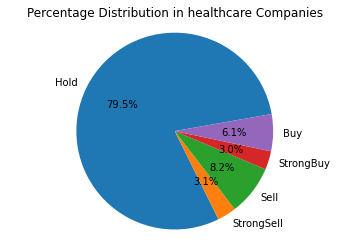

In [67]:
#piechart
labels = 'Hold', 'StrongSell', 'Sell', 'StrongBuy', 'Buy'
sizes = [79.52, 3.11, 8.22, 3.04,6.08]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=10)
ax1.axis('equal')  
plt.title("Percentage Distribution in healthcare Companies")
plt.show()


In [68]:
#technology sector
#lets check for Technology 
df1=data[(data['Sector']=='Technology') & (data['Recommendation']=='Hold')]
df2=data[(data['Sector']=='Technology') & (data['Recommendation']=='Strong Sell')]
df3=data[(data['Sector']=='Technology') & (data['Recommendation']=='Sell')]
df4=data[(data['Sector']=='Technology') & (data['Recommendation']=='Strong Buy')]
df5=data[(data['Sector']=='Technology') & (data['Recommendation']=='Buy')]

# Technology  and hold

print("% of hold in Technology companies =", (df1.shape[0]/7142)*100)

#Technology  and Strong Sell

print("% of Strong Sell in Technology companies =", (df2.shape[0]/7142)*100)

#Technology  and sell

print("% of Sell in Technology companies =", (df3.shape[0]/7142)*100)

#Technology  and Strong Buy

print("% of Strong Buy in Technology companies =", (df4.shape[0]/7142)*100)

#Technology  and Buy

print("% of Buy in Technology companies =", (df5.shape[0]/7142)*100)



% of hold in Technology companies = 52.04424530943713
% of Strong Sell in Technology companies = 3.2483898067768138
% of Sell in Technology companies = 8.232987958555027
% of Strong Buy in Technology companies = 1.8062167460095213
% of Buy in Technology companies = 4.732567908148978


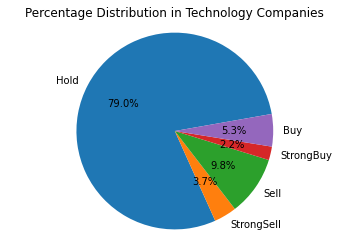

In [69]:
#piechart
labels = 'Hold', 'StrongSell', 'Sell', 'StrongBuy', 'Buy'
sizes = [78.94, 3.72,9.78, 2.22,5.32]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=10)
ax1.axis('equal')  
plt.title("Percentage Distribution in Technology Companies")
plt.show()

In [70]:
#Consumer Cyclical sector
#lets check for Consumer Cyclical 
df1=data[(data['Sector']=='Consumer Cyclical') & (data['Recommendation']=='Hold')]
df2=data[(data['Sector']=='Consumer Cyclical') & (data['Recommendation']=='Strong Sell')]
df3=data[(data['Sector']=='Consumer Cyclical') & (data['Recommendation']=='Sell')]
df4=data[(data['Sector']=='Consumer Cyclical') & (data['Recommendation']=='Strong Buy')]
df5=data[(data['Sector']=='Consumer Cyclical') & (data['Recommendation']=='Buy')]

# Consumer Cyclical  and hold

print("% of hold in Consumer Cyclical companies =", (df1.shape[0]/5030)*100)

#Consumer Cyclical  and Strong Sell

print("% of Strong Sell in Consumer Cyclical companies =", (df2.shape[0]/5030)*100)

#Consumer Cyclical  and sell

print("% of Sell in Consumer Cyclical companies =", (df3.shape[0]/5030)*100)

#Consumer Cyclical  and Strong Buy

print("% of Strong Buy in Consumer Cyclical companies =", (df4.shape[0]/5030)*100)

#Consumer Cyclical  and Buy

print("% of Buy in Consumer Cyclical companies =", (df5.shape[0]/5030)*100)



% of hold in Consumer Cyclical companies = 57.415506958250496
% of Strong Sell in Consumer Cyclical companies = 3.6779324055666
% of Sell in Consumer Cyclical companies = 8.687872763419483
% of Strong Buy in Consumer Cyclical companies = 2.3061630218687874
% of Buy in Consumer Cyclical companies = 6.083499005964215


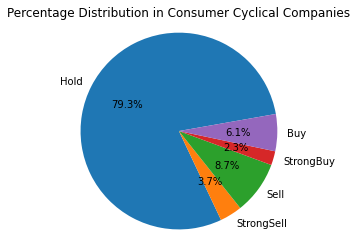

In [71]:
#piechart
labels = 'Hold', 'StrongSell', 'Sell', 'StrongBuy', 'Buy'
sizes = [79.2, 3.67,8.68, 2.30,6.08]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=10)
ax1.axis('equal')  
plt.title("Percentage Distribution in Consumer Cyclical Companies")
plt.show()

Percentage distribution in Healthcare, Technical, and Consumer cyclical companies is almost same for all class labels and that is the reason this feature wont be useful for classification.

---



# Feature-'Industry'


In [72]:
data['Industry'].value_counts()

Biotechnology                         4678
Software—Application                  2064
Software—Infrastructure               1638
Internet Retail                       1218
Internet Content & Information        1179
Credit Services                        813
Auto Manufacturers                     779
Specialty Retail                       764
Medical Distribution                   755
Diagnostics & Research                 666
Financial Data & Stock Exchanges       446
Electronic Components                  442
Consumer Electronics                   431
Information Technology Services        429
Banks—Regional                         419
Trucking                               414
Industrial Distribution                403
Health Information Services            400
Apparel Retail                         394
Furnishings, Fixtures & Appliances     390
Apparel Manufacturing                  387
Building Products & Equipment          369
Name: Industry, dtype: int64

We have stocks for multiple industries

---



---



Now we want to build a Machine Learning System where we don't want model to behave according to different industries because we could have more lot more industries.
So according to business requirenment, we won't use this feature. 

#Feature-'MarketType'



In [73]:
print(data['Marketcap'].value_counts())
#so most of the majority is of largecap followed by small cap,
#then midcap, then microcap

Largecap    10139
Smallcap     5527
Midcap       3138
Microcap      674
Name: Marketcap, dtype: int64


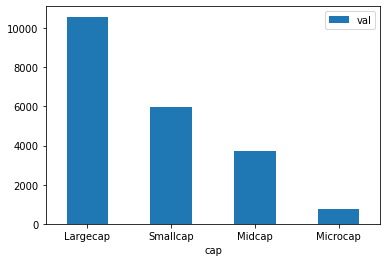

In [74]:
df=pd.DataFrame({'cap':['Largecap','Smallcap','Midcap','Microcap'],'val':[10583,5967,3716,743]})
ax = df.plot.bar(x='cap', y='val', rot=0)


In [75]:
#lets find out the trend in  largecap companies 
df1=data[(data['Marketcap']=='Largecap') & (data['Recommendation']=='Hold')]
df2=data[(data['Marketcap']=='Largecap') & (data['Recommendation']=='Strong Sell')]
df3=data[(data['Marketcap']=='Largecap') & (data['Recommendation']=='Sell')]
df4=data[(data['Marketcap']=='Largecap') & (data['Recommendation']=='Strong Buy')]
df5=data[(data['Marketcap']=='Largecap') & (data['Recommendation']=='Buy')]

In [76]:
#largecap and hold
a=df1[['Marketcap','Recommendation']].count()

print("% of hold in large cap companies =", (7755/10583)*100)

#largecap and Strong Sell
b=df2[['Marketcap','Recommendation']].count()

print("% of Strong Sell in large cap companies =", (480/10583)*100)

#largecap and sell
c=df3[['Marketcap','Recommendation']].count()

print("% of Sell in large cap companies =", (1276/10583)*100)

#largecap and Strong Buy
d=df4[['Marketcap','Recommendation']].count()

print("% of Strong Buy in large cap companies =", (319/10583)*100)

#largecap and Buy
e=df5[['Marketcap','Recommendation']].count()

print("% of Buy in large cap companies =", (753/10583)*100)


% of hold in large cap companies = 73.2778985164887
% of Strong Sell in large cap companies = 4.535575923651139
% of Sell in large cap companies = 12.057072663705943
% of Strong Buy in large cap companies = 3.014268165926486
% of Buy in large cap companies = 7.115184730227724


# **largecap companies**
1.In last one year, 73.27% times it was best to "Hold" stocks in largecap
companies.

2.In last one year, only 4.53% times it was "Strong Sell" stocks in largecap companies.

3.In last one year, only 12.05% times it was "Sell" stocks in largecap companies.

4.In last one year, only 3.01% times it was "Strong Buy" stocks in largecap companies.

5.In last one year, only 7.11% times it was "Buy" stocks in largecap companies.


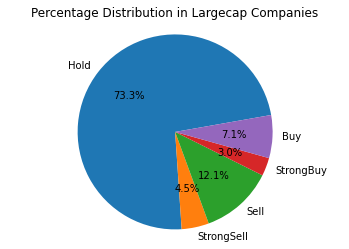

In [77]:
#lets plot a pie chart for the percentage distribution in largecap companies

labels = 'Hold', 'StrongSell', 'Sell', 'StrongBuy', 'Buy'
sizes = [73.27, 4.53, 12.05, 3.01,7.11]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=10)
ax1.axis('equal')  
plt.title("Percentage Distribution in Largecap Companies")
plt.show()

In [78]:
#lets find out the trend in  smallcap companies 
dfa11=data[(data['Marketcap']=='Smallcap') & (data['Recommendation']=='Hold')]
dfa22=data[(data['Marketcap']=='Smallcap') & (data['Recommendation']=='Strong Sell')]
dfa33=data[(data['Marketcap']=='Smallcap') & (data['Recommendation']=='Sell')]
dfa44=data[(data['Marketcap']=='Smallcap') & (data['Recommendation']=='Strong Buy')]
dfa55=data[(data['Marketcap']=='Smallcap') & (data['Recommendation']=='Buy')]



In [79]:
#smallcap and hold
a=dfa11[['Marketcap','Recommendation']].count()

print("% of hold in small cap companies =", (4284/5967)*100)

#smallcap and Strong Sell
b=dfa22[['Marketcap','Recommendation']].count()

print("% of Strong Sell in small cap companies =", (240/5967)*100)

#smallcap and sell
c=dfa33[['Marketcap','Recommendation']].count()

print("% of Sell in small cap companies =", (627/5967)*100)

#smallcap and Strong Buy
d=dfa44[['Marketcap','Recommendation']].count()

print("% of Strong Buy in small cap companies =", (235/5967)*100)

#smallcap and Buy
e=dfa55[['Marketcap','Recommendation']].count()

print("% of Buy in small cap companies =", (581/5967)*100)

% of hold in small cap companies = 71.7948717948718
% of Strong Sell in small cap companies = 4.022121669180493
% of Sell in small cap companies = 10.507792860734037
% of Strong Buy in small cap companies = 3.9383274677392324
% of Buy in small cap companies = 9.736886207474443


Text(0.5, 1.0, 'Percentage Distribution in smallcap Companies')

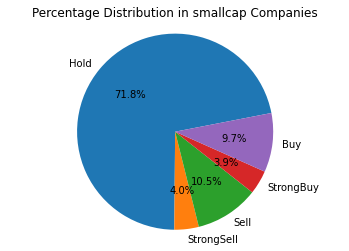

In [80]:
#lets plot a pie chart for the percentage distribution in smallcap
label1 = 'Hold', 'StrongSell', 'Sell', 'StrongBuy', 'Buy'
percent = [71.79, 4.02, 10.50, 3.93,9.73 ]

fig1, ax1 = plt.subplots()
ax1.pie(percent, labels=label1, autopct='%1.1f%%',
        shadow=False, startangle=11)
ax1.axis('equal')  
plt.title("Percentage Distribution in smallcap Companies")


In [81]:
#lets find out the trend in  midcap companies 
df11=data[(data['Marketcap']=='Midcap') & (data['Recommendation']=='Hold')]
df22=data[(data['Marketcap']=='Midcap') & (data['Recommendation']=='Strong Sell')]
df33=data[(data['Marketcap']=='Midcap') & (data['Recommendation']=='Sell')]
df44=data[(data['Marketcap']=='Midcap') & (data['Recommendation']=='Strong Buy')]
df55=data[(data['Marketcap']=='Midcap') & (data['Recommendation']=='Buy')]

In [82]:
#midcap and hold
a=df11[['Marketcap','Recommendation']].count()

print("% of hold in mid cap companies =", (2711/3716))

#midcap and Strong Sell
b=df22[['Marketcap','Recommendation']].count()

print("% of Strong Sell in mid cap companies =", (174/3716))

#midcap and sell
c=df33[['Marketcap','Recommendation']].count()

print("% of Sell in mid cap companies =", (441/3716))

#midcap and Strong Buy
d=df44[['Marketcap','Recommendation']].count()

print("% of Strong Buy in mid cap companies =", (127/3716))

#midcap and Buy
e=df55[['Marketcap','Recommendation']].count()

print("% of Buy in mid cap companies =", (263/3716))



% of hold in mid cap companies = 0.7295479009687836
% of Strong Sell in mid cap companies = 0.04682454251883746
% of Sell in mid cap companies = 0.11867599569429495
% of Strong Buy in mid cap companies = 0.034176533907427344
% of Buy in mid cap companies = 0.07077502691065662


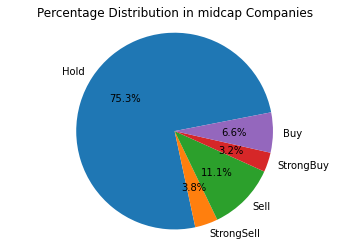

In [83]:
#lets plot a pie chart for the percentage distribution in midcap companies

label = 'Hold', 'StrongSell', 'Sell', 'StrongBuy', 'Buy'
percent = [80, 4, 11.8, 3.41,7 ]

fig1, ax1 = plt.subplots()
ax1.pie(percent, labels=label, autopct='%1.1f%%',
        shadow=False, startangle=11)
ax1.axis('equal')  
plt.title("Percentage Distribution in midcap Companies")
plt.show()

All the market caps whether it is Largecap, midcap and smallcap, all have same percentage distributions in class labels, this feature is not very useful in classification.

# Feature-'MarketType'

In [84]:
#MarketType

print(data['MarketType'].value_counts())


Trading      8490
UpTrend      5867
WeekTrend    3727
DownTrend    2898
Name: MarketType, dtype: int64


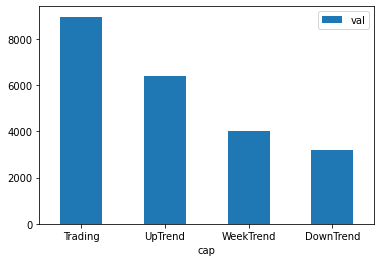

In [85]:
df=pd.DataFrame({'cap':['Trading','UpTrend','WeekTrend','DownTrend'],'val':[8967,6380,4017,3217]})
ax = df.plot.bar(x='cap', y='val', rot=0)

In [86]:
#let's see how market type and recommendations are connected
da=data[(data['MarketType']=='Trading') & (data['Recommendation']=='Hold')]
db=data[(data['MarketType']=='Trading') & (data['Recommendation']=='Strong Sell')]
dc=data[(data['MarketType']=='Trading') & (data['Recommendation']=='Sell')]
dd=data[(data['MarketType']=='Trading') & (data['Recommendation']=='Strong Buy')]
de=data[(data['MarketType']=='Trading') & (data['Recommendation']=='Buy')]

In [87]:
#trading

a=da[['MarketType','Recommendation']].count()

print("% of hold in trading =", (6706/8967))

b=db[['MarketType','Recommendation']].count()

print("% of strong sell in trading =", (296/8967))

c=dc[['MarketType','Recommendation']].count()

print("% of sell in trading =", (845/8967))

d=dd[['MarketType','Recommendation']].count()

print("% of strong buy in trading =", (167/8967))

e=de[['MarketType','Recommendation']].count()

print("% of buy in trading =", (953/8967))


% of hold in trading = 0.7478532396565184
% of strong sell in trading = 0.03300992528158805
% of sell in trading = 0.0942344150775064
% of strong buy in trading = 0.018623842979814877
% of buy in trading = 0.10627857700457231


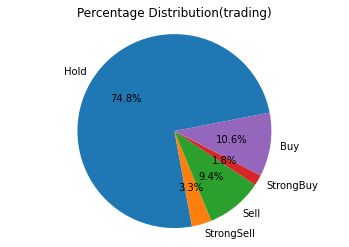

In [88]:

labelt = 'Hold', 'StrongSell', 'Sell', 'StrongBuy', 'Buy'
percentt = [74.7, 3.3, 9.4, 1.8,10.6 ]

fig1, ax1 = plt.subplots()
ax1.pie(percentt, labels=labelt, autopct='%1.1f%%',
        shadow=False, startangle=11)
ax1.axis('equal')  
plt.title("Percentage Distribution(trading)")
plt.show()

In [89]:
#uptrend

print("Total number of datapoint belong to uptrend=",6380 )

da1=data[(data['MarketType']=='UpTrend') & (data['Recommendation']=='Hold')]

print("% of hold in uptrend =", (4542/6380)*100)

db1=data[(data['MarketType']=='UpTrend') & (data['Recommendation']==' Strong Sell')]

print("% of strong sell in uptrend=", (0/6380))

dc1=data[(data['MarketType']=='UpTrend') & (data['Recommendation']=='Sell')]

print("% of sell in uptrend =", (899/6380)*100)

dd1=data[(data['MarketType']=='UpTrend') & (data['Recommendation']=='Strong Buy')]

print("% of strong buy in uptrend =", (237/6380)*100)

de1=data[(data['MarketType']=='UpTrend') & (data['Recommendation']=='Buy')]

print("% of buy in uptrend =", (269/6380)*100)

Total number of datapoint belong to uptrend= 6380
% of hold in uptrend = 71.19122257053291
% of strong sell in uptrend= 0.0
% of sell in uptrend = 14.09090909090909
% of strong buy in uptrend = 3.7147335423197494
% of buy in uptrend = 4.216300940438871


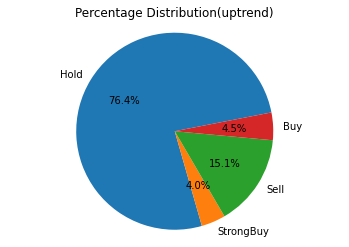

In [90]:
labelu = 'Hold','StrongBuy','Sell','Buy'
percentu = [ 71.19, 3.71,14.09,4.21 ]

fig1, ax1 = plt.subplots()
ax1.pie(percentu ,labels=labelu, autopct='%1.1f%%',
        shadow=False, startangle=11)
ax1.axis('equal')  
plt.title("Percentage Distribution(uptrend)")
plt.show()

In [91]:
#weektrend

print("Total number of datapoint belong to WeekTrend=",4017 )

dw1=data[(data['MarketType']=='WeekTrend') & (data['Recommendation']=='Hold')]

print("% of hold in Weektrend =", (2936/4017)*100)

dw2=data[(data['MarketType']=='WeekTrend') & (data['Recommendation']=='Strong Sell')]

print("% of strong sell in weektrend=", (179/4017)*100)

dw3=data[(data['MarketType']=='WeekTrend') & (data['Recommendation']=='Sell')]

print("% of sell in Weektrend =", (471/4017)*100)

dw4=data[(data['MarketType']=='WeekTrend') & (data['Recommendation']=='Strong Buy')]

print("% of strong buy in Weektrend =", (200/4017)*100)

dw5=data[(data['MarketType']=='WeekTrend') & (data['Recommendation']=='Buy')]

print("% of buy in Weektrend =", (231/4017)*100)

Total number of datapoint belong to WeekTrend= 4017
% of hold in Weektrend = 73.08937017674882
% of strong sell in weektrend= 4.456061737615135
% of sell in Weektrend = 11.725168035847648
% of strong buy in Weektrend = 4.978839930296241
% of buy in Weektrend = 5.7505601194921585


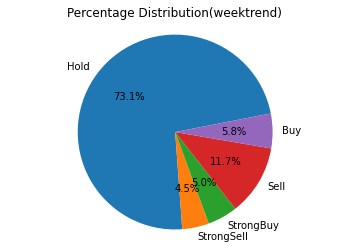

In [92]:
labelu = 'Hold','StrongSell','StrongBuy','Sell','Buy'
percentu = [ 73.09, 4.45,4.97,11.72,5.75 ]

fig1, ax1 = plt.subplots()
ax1.pie(percentu ,labels=labelu, autopct='%1.1f%%',
        shadow=False, startangle=11)
ax1.axis('equal')  
plt.title("Percentage Distribution(weektrend)")
plt.show()

Market type feature is showing some distribution changes in different categories.
For Example- In weektrend BUY is around 5.8% and in Uptrend it is 10.6%, so this feature can be helpful in classification.

# **Feature_ Close**


mean of the feature close is  146.99550471833066
median of feature close is  43.305
75th percentile for hold is  145.0425
25th percentile for hold is  11.1025
75th percentile for strong sell is 149.84
25th percentile for strong sell is  12.07
75th percentile for sell is  165.685
25th percentile for sell is  12.7425
75th percentile for Buy is  119.8
25th percentile for Buy is  8.8025
75th percentile for Strong Buy is  115.75
75th percentile for Strong Buy is  6.89


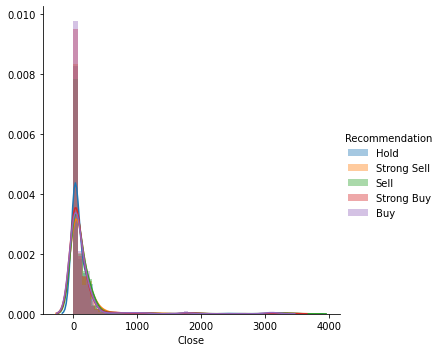

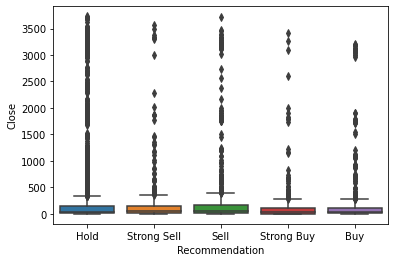

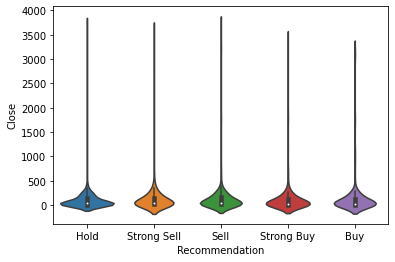

In [93]:
a=np.mean(data.Close)      

print("mean of the feature close is ",a)
b=np.median(data.Close)
print("median of feature close is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']

c=np.percentile(sa['Close'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['Close'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['Close'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['Close'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['Close'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['Close'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['Close'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['Close'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['Close'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['Close'],25)
print("75th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, "Close",kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='Close', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='Close', data=data)

#**Conclusion**

1. First plot is the pdf for feature 'Close', we can see,there is high overlapping between classes and that means close is not helping much to classify class labels.

2. Second plot is the box plot, from box plot also we are not able to distinguish class labels, all of them seems to have almost same 75th,50th and 20th percentile.

3. Third plot is violin plot, it is giving us individual class label distribution and percentiles associated with that class label, from violin plot also it is difficult to come up with any conclusion.

#Feature - 'Change%'

In [94]:
data['Change%']=data['Change%'].fillna(0)

mean of the feature 'Change%' is  0.465280716804883
median of feature 'Change%' is  0.14
75th percentile for change% is  2.27
25th percentile for change% is  -1.92
75th percentile for hold is  2.41
25th percentile for hold is  -1.58
75th percentile for strong sell is 1.355
25th percentile for strong sell is  -3.545
75th percentile for sell is  0.77
25th percentile for sell is  -2.99
75th percentile for Buy is  2.34
25th percentile for Buy is  -2.3675
75th percentile for Strong Buy is  4.88
25th percentile for Strong Buy is  -0.78


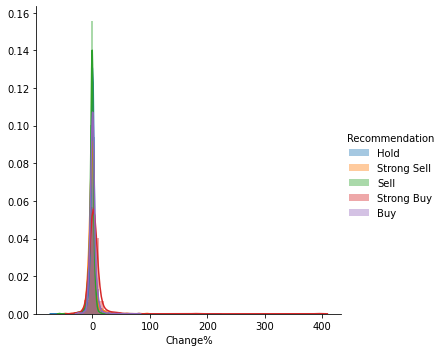

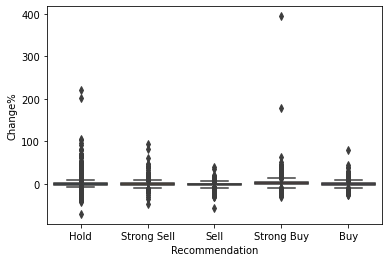

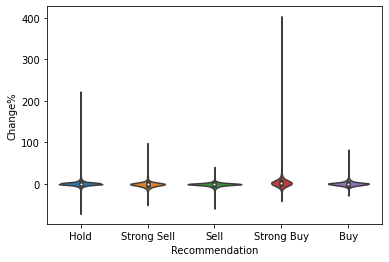

In [95]:
#Change%
a=np.mean(data['Change%'])      

print("mean of the feature 'Change%' is ",a)
b=np.median(data['Change%'])
print("median of feature 'Change%' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['Change%'],75)
print("75th percentile for change% is ",y)

z=np.percentile(data['Change%'],25)
print("25th percentile for change% is ",z)


c=np.percentile(sa['Change%'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['Change%'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['Change%'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['Change%'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['Change%'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['Change%'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['Change%'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['Change%'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['Change%'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['Change%'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'Change%',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='Change%', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='Change%', data=data)

plt.show()

#**Conclusion**

1. First plot is the pdf for feature 'Change%', we can see,there is high overlapping between classes and that means close is not helping much to classify class labels.

2. Second plot is the box plot, from box plot also we are not able to distinguish class labels, all of them seems to have almost same 75th,50th and 20th percentile.

3. Third plot is violin plot, it is giving us individual class label distribution and percentiles associated with that class label, from violin plot also it is difficult to come up with any conclusion.

#Feature- 52wLOW

mean of the feature '52wLow' is  76.50146935468287
median of feature '52wLow' is  20.04
75th percentile for 52wLow is  64.88
25th percentile for 52wLow is  4.25
75th percentile for hold is  64.88
25th percentile for hold is  4.2524999999999995
75th percentile for strong sell is 63.51
25th percentile for strong sell is  4.25
75th percentile for sell is  68.06
25th percentile for sell is  4.32
75th percentile for Buy is  63.51
25th percentile for Buy is  4.1025
75th percentile for Strong Buy is  48.15
25th percentile for Strong Buy is  3.25


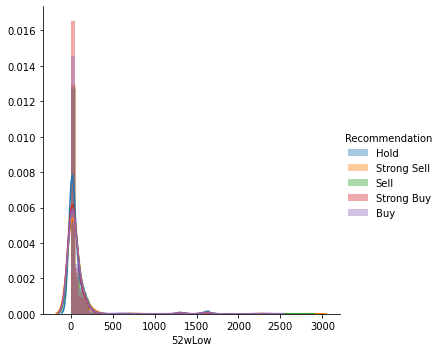

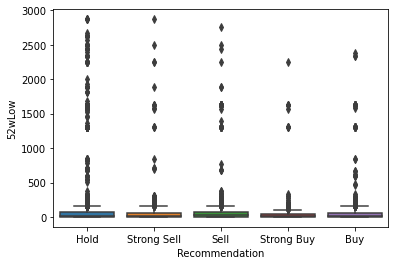

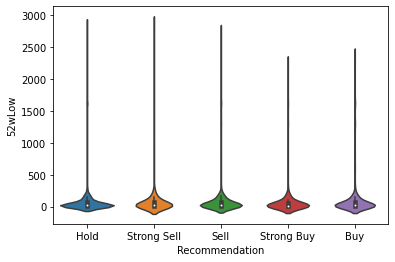

In [96]:
a=np.mean(data['52wLow'])      

print("mean of the feature '52wLow' is ",a)
b=np.median(data['52wLow'])
print("median of feature '52wLow' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['52wLow'],75)
print("75th percentile for 52wLow is ",y)

z=np.percentile(data['52wLow'],25)
print("25th percentile for 52wLow is ",z)


c=np.percentile(sa['52wLow'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['52wLow'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['52wLow'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['52wLow'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['52wLow'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['52wLow'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['52wLow'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['52wLow'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['52wLow'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['52wLow'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, '52wLow',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='52wLow', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='52wLow', data=data)

plt.show()

#**Conclusion**

1. First plot is the pdf for feature '52wLow%', we can see,there is high overlapping between classes and that means close is not helping much to classify class labels.

2. Second plot is the box plot, from box plot also we are not able to distinguish class labels, all of them seems to have almost same 75th,50th and 20th percentile.

3. Third plot is violin plot, it is giving us individual class label distribution and percentiles associated with that class label, from violin plot also it is difficult to come up with any conclusion.

#Feature- 52wHigh

mean of the feature '52wHigh' is  171.52375750643785
median of feature '52wHigh' is  53.69
75th percentile for 52wHigh is  185.75
75th percentile for 52wHigh is  19.5
25th percentile for hold is  185.75
25th percentile for Hold is  19.5
75th percentile for strong sell is 179.695
25th percentile for strong sell is  19.805
75th percentile for sell is  193.71000000000004
25th percentile for sell is  21.6
75th percentile for Buy is  185.75
25th percentile for Buy is  18.85
75th percentile for Strong Buy is  151.0
25th percentile for Strong Buy is  17.3


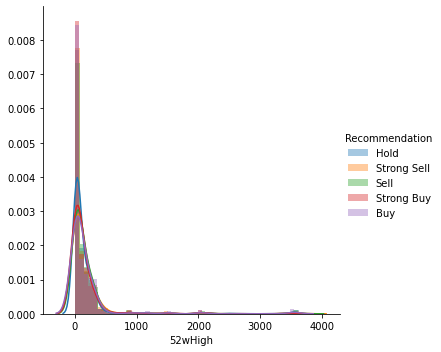

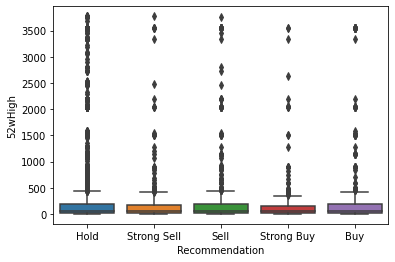

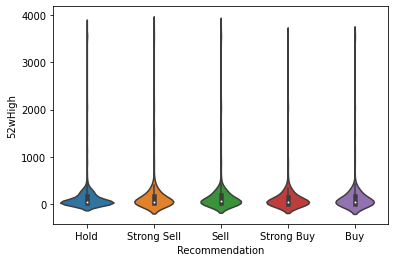

In [97]:
a=np.mean(data['52wHigh'])      

print("mean of the feature '52wHigh' is ",a)
b=np.median(data['52wHigh'])
print("median of feature '52wHigh' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['52wHigh'],75)
print("75th percentile for 52wHigh is ",y)

z=np.percentile(data['52wHigh'],25)
print("75th percentile for 52wHigh is ",z)


c=np.percentile(sa['52wHigh'],75)
print("25th percentile for hold is ",c)

n=np.percentile(sa['52wHigh'],25)
print("25th percentile for Hold is ",n)

d=np.percentile(sb['52wHigh'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['52wHigh'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['52wHigh'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['52wHigh'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['52wHigh'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['52wHigh'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['52wHigh'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['52wHigh'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, '52wHigh',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='52wHigh', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='52wHigh', data=data)

#**Conclusion**

1. First plot is the pdf for feature 'Change%', we can see,there is high overlapping between classes and that means close is not helping much to classify class labels.

2. Second plot is the box plot, from box plot also we are not able to distinguish class labels, all of them seems to have almost same 75th,50th and 20th percentile.

3. Third plot is violin plot, it is giving us individual class label distribution and percentiles associated with that class label, from violin plot also it is difficult to come up with any conclusion.

#Feature-- 'ADX'

mean of the feature 'ADX' is  24.807671813935862
median of feature 'ADX' is  22.49
75th percentile for ADX is  30.98
25th percentile for ADX is  16.89
75th percentile for hold is  30.89
25th percentile for hold is  16.62
75th percentile for strong sell is 34.325
25th percentile for strong sell is  19.130000000000003
75th percentile for sell is  31.947499999999998
25th percentile for sell is  17.91
75th percentile for Buy is  27.415
25th percentile for Buy is  15.76
75th percentile for Strong Buy is  32.68
25th percentile for Strong Buy is  20.71


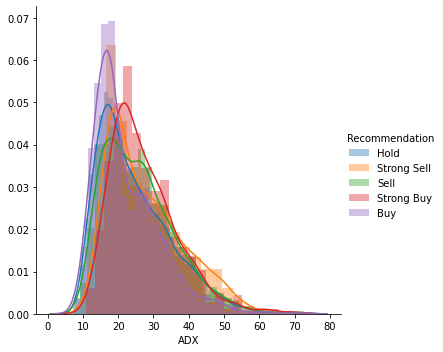

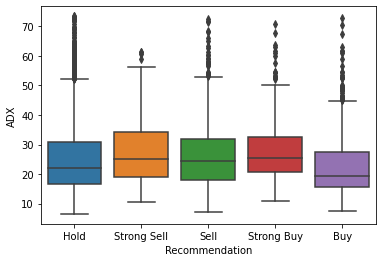

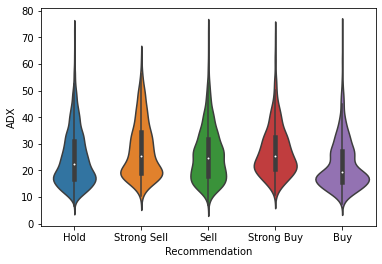

In [98]:
a=np.mean(data['ADX'])      

print("mean of the feature 'ADX' is ",a)
b=np.median(data['ADX'])
print("median of feature 'ADX' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['ADX'],75)
print("75th percentile for ADX is ",y)

z=np.percentile(data['ADX'],25)
print("25th percentile for ADX is ",z)


c=np.percentile(sa['ADX'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['ADX'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['ADX'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['ADX'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['ADX'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['ADX'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['ADX'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['ADX'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['ADX'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['ADX'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'ADX',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='ADX', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='ADX', data=data)

#**Conclusion**

1. First plot is the pdf for feature 'ADX', we can see,there is overlapping between but this feature could be useful for classification as per domain knowledge.

2. Second plot is the box plot, from box plot we can see percentiles which are almost same for every class.

3. Third plot is violin plot, it is giving us individual class label distribution and percentiles associated with that class label, from violin plot also it is difficult to come up with any conclusion except BUY class label has a slight variation in distribution and percentiles.

#Feature --'WILLIAM%R'

mean of the feature 'William%R' is  -44.614862262892146
median of feature 'William%R' is  -40.295
75th percentile for change% is  -16.5425
25th percentile for change% is  -72.5375
75th percentile for hold is  -17.6825
25th percentile for hold is  -69.4675
75th percentile for strong sell is -11.625
25th percentile for strong sell is  -68.72
75th percentile for sell is  -11.94
25th percentile for sell is  -36.73
75th percentile for Buy is  -73.655
25th percentile for Buy is  -92.23
75th percentile for Strong Buy is  -11.81
25th percentile for Strong Buy is  -72.01


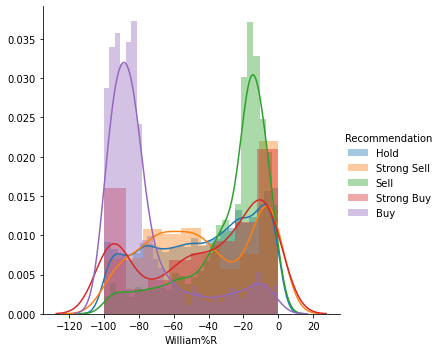

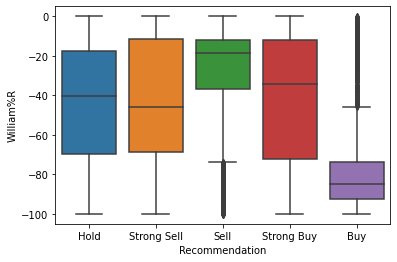

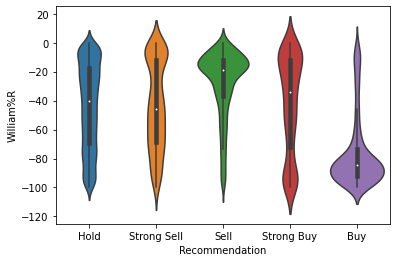

In [99]:
# feature william%R
a=np.mean(data['William%R'])      

print("mean of the feature 'William%R' is ",a)
b=np.median(data['William%R'])
print("median of feature 'William%R' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['William%R'],75)
print("75th percentile for change% is ",y)

z=np.percentile(data['William%R'],25)
print("25th percentile for change% is ",z)


c=np.percentile(sa['William%R'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['William%R'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['William%R'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['William%R'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['William%R'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['William%R'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['William%R'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['William%R'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['William%R'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['William%R'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'William%R',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='William%R', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='William%R', data=data)
plt.show()

#**Conclusion**

1. First plot is the pdf for feature 'William%R', we can see,there is less overlapping between features,There is a clear gap between Buy and Sell in the distribution.

2. Second plot is the box plot, from box plot we can see percentiles which are different here for different class labels, that is a good sign means this feature can be useful in classifying the class labels.

3. Third plot is violin plot, it is giving us individual class label distribution and percentiles associated with that class label, from violin plot it is also very clear that distribution of individual class labels also varying.

#Feature -- 'RSI'

mean of the feature 'RSI' is  53.51651892097989
median of feature 'RSI' is  54.02
75th percentile for change% is  62.557500000000005
25th percentile for change% is  44.75
75th percentile for hold is  62.61
25th percentile for hold is  45.9
75th percentile for strong sell is 68.275
25th percentile for strong sell is  50.489999999999995
75th percentile for sell is  64.1375
25th percentile for sell is  52.54
75th percentile for Buy is  43.58
25th percentile for Buy is  36.015
75th percentile for Strong Buy is  64.61
25th percentile for Strong Buy is  33.76


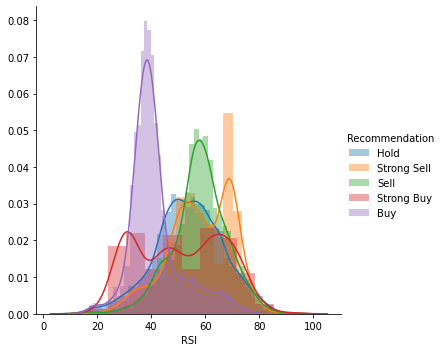

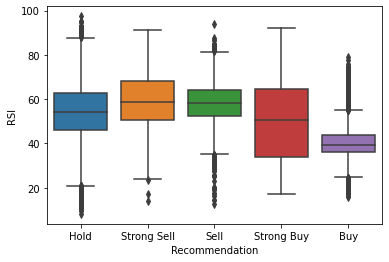

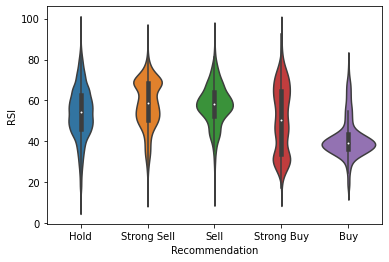

In [100]:
# feature RSI
a=np.mean(data['RSI'])      

print("mean of the feature 'RSI' is ",a)
b=np.median(data['RSI'])
print("median of feature 'RSI' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['RSI'],75)
print("75th percentile for change% is ",y)

z=np.percentile(data['RSI'],25)
print("25th percentile for change% is ",z)


c=np.percentile(sa['RSI'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['RSI'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['RSI'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['RSI'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['RSI'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['RSI'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['RSI'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['RSI'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['RSI'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['RSI'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'RSI',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='RSI', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='RSI', data=data)
plt.show()



#**Conclusion**

1. First plot is the pdf for feature 'RSI', we can see,there is less overlapping between features,There is a clear gap between Buy and Sell, Strong sell in the distribution.

2. Second plot is the box plot, from box plot we can see percentiles which are different here for different class labels, that is a good sign means this feature can be useful in classifying the class labels.

3. Third plot is violin plot, it is giving us individual class label distribution and percentiles associated with that class label, from violin plot it is also very clear that distribution of individual class labels also varying.

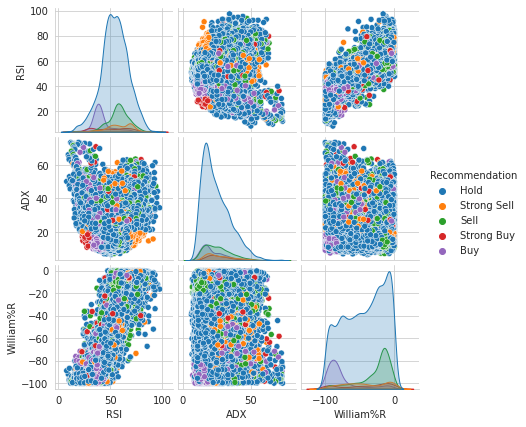

In [101]:
#Pair Plot (RSI, ADX AND WILLIAM%R)

data2=data[['RSI','ADX','William%R','Recommendation']]

sns.set_style("whitegrid");
sns.pairplot(data2,hue='Recommendation', size=2);
plt.show()

#**Conclusion**

1. From the above plot we  can scattering between features(ADX,WILLIAM%R, RSI), these are important features when it comes to domain knowledge.

2. In Scattering between ADX and RSI, we can clearly see that there is a red color patch(STRONG BUY), also there is a orange color patch(STRONG SELL), Buy and Sell is spread all over the place.

3. In other plot, we cant see any clear patches as data is spread all over the place.

Text(0.5, 1.0, 'Correlation Heatmap')

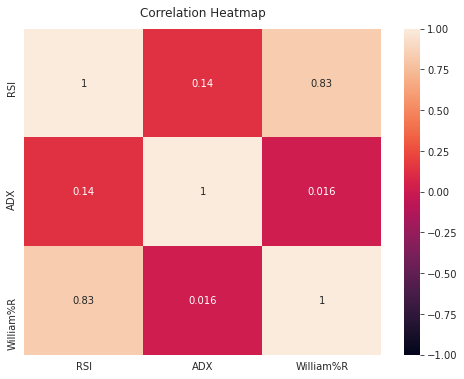

In [102]:
# Let's find out correlation between RSI, ADX AND William%R 
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(data2.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

#**Conclusion**

1. RSI and William%r have correlation of 0.83, means they are highly correlated.

2. ADX and William%r have correlation of 0.016, very less correlation.

3. ADX and RSI have correlation of 0.11, very less correaltion.

#Feature- %K(Fast)

mean of the feature '%K(Smooth)' is  55.25075540939812
median of feature '%K(Smooth)' is  59.155
75th percentile for change% is  81.2075
25th percentile for change% is  29.94
75th percentile for hold is  80.3375
25th percentile for hold is  31.6625
75th percentile for strong sell is 86.22999999999999
25th percentile for strong sell is  47.769999999999996
75th percentile for sell is  88.00250000000001
25th percentile for sell is  67.32499999999999
75th percentile for Buy is  29.535
25th percentile for Buy is  10.63
75th percentile for Strong Buy is  74.11
25th percentile for Strong Buy is  23.07


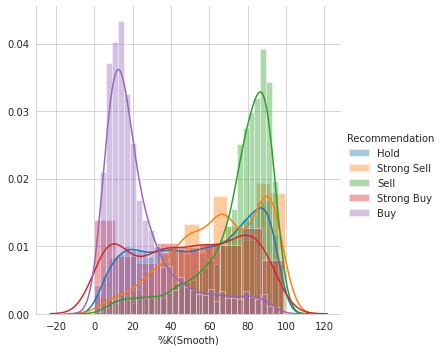

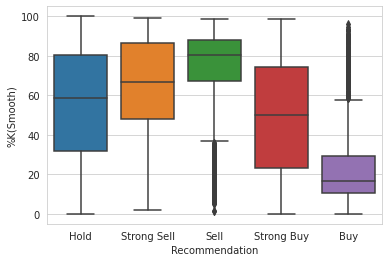

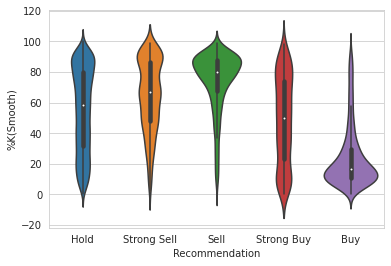

In [103]:
a=np.mean(data['%K(Smooth)'])      

print("mean of the feature '%K(Smooth)' is ",a)
b=np.median(data['%K(Smooth)'])
print("median of feature '%K(Smooth)' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['%K(Smooth)'],75)
print("75th percentile for change% is ",y)

z=np.percentile(data['%K(Smooth)'],25)
print("25th percentile for change% is ",z)


c=np.percentile(sa['%K(Smooth)'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['%K(Smooth)'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['%K(Smooth)'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['%K(Smooth)'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['%K(Smooth)'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['%K(Smooth)'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['%K(Smooth)'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['%K(Smooth)'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['%K(Smooth)'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['%K(Smooth)'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, '%K(Smooth)',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='%K(Smooth)', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='%K(Smooth)', data=data)
plt.show()

#**Conclusion**

1. First plot is the pdf for feature '%KSmooth', we can see,there is less overlapping between features,There is a clear gap between Buy and Sell, Strong sell in the distribution.

2. Second plot is the box plot, from box plot we can see percentiles which are different here for different class labels, that is a good sign means this feature can be useful in classifying the class labels.

3. Third plot is violin plot, it is giving us individual class label distribution and percentiles associated with that class label, from violin plot it is also very clear that distribution of individual class labels also varying.

#Feature-- (%Dsmooth)

mean of the feature '%D(Smooth)' is  55.061323515394335
median of feature '%D(Smooth)' is  58.724999999999994
75th percentile for change% is  80.0175
25th percentile for change% is  30.79
75th percentile for hold is  79.29
25th percentile for hold is  31.85
75th percentile for strong sell is 85.185
25th percentile for strong sell is  56.760000000000005
75th percentile for sell is  87.78
25th percentile for sell is  62.7975
75th percentile for Buy is  36.2325
25th percentile for Buy is  12.2925
75th percentile for Strong Buy is  63.09
25th percentile for Strong Buy is  21.41


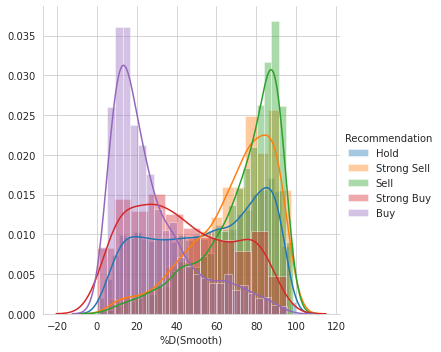

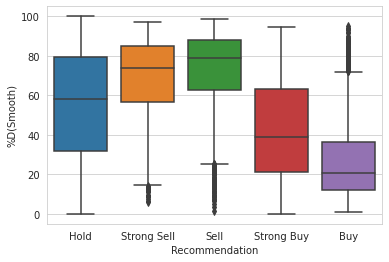

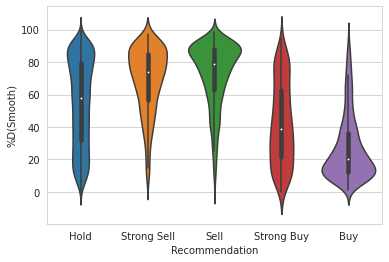

In [104]:
a=np.mean(data['%D(Smooth)'])      

print("mean of the feature '%D(Smooth)' is ",a)
b=np.median(data['%D(Smooth)'])
print("median of feature '%D(Smooth)' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['%D(Smooth)'],75)
print("75th percentile for change% is ",y)

z=np.percentile(data['%D(Smooth)'],25)
print("25th percentile for change% is ",z)


c=np.percentile(sa['%D(Smooth)'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['%D(Smooth)'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['%D(Smooth)'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['%D(Smooth)'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['%D(Smooth)'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['%D(Smooth)'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['%D(Smooth)'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['%D(Smooth)'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['%D(Smooth)'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['%D(Smooth)'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, '%D(Smooth)',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='%D(Smooth)', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='%D(Smooth)', data=data)
plt.show()

#**Conclusion**

1. First plot is the pdf for feature '%DSmooth', we can see,there is less overlapping between features,There is a clear gap between Buy and Sell, Strong sell in the distribution.

2. Second plot is the box plot, from box plot we can see percentiles which are different here for different class labels, that is a good sign means this feature can be useful in classifying the class labels.

3. Third plot is violin plot, it is giving us individual class label distribution and percentiles associated with that class label, from violin plot it is also very clear that distribution of individual class labels also varying.

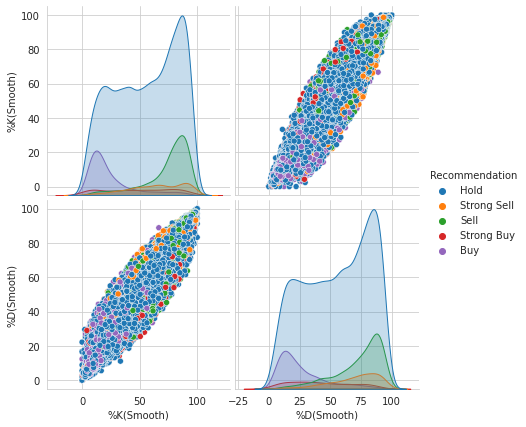

In [105]:
#pairplot
data_cor=data[['%K(Smooth)','%D(Smooth)','Recommendation']]

sns.set_style("whitegrid");
sns.pairplot(data_cor,hue="Recommendation", size=3);
plt.show()

Text(0.5, 1.0, 'Correlation Heatmap')

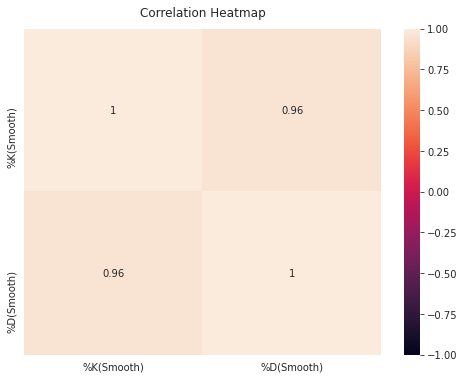

In [106]:
# In above correlation matrix, let's see the values of correlation


plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(data_cor.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

#**Conclusion**

There is a high correlation between %K(Smooth) and %D(Smooth), correlation value of 0.96.

#Feature--'%Above_52wLow'

mean of the feature '%Above_52wLow' is  214.90099418549121
median of feature '%Above_52wLow' is  88.305
75th percentile for %Above_52wLow is  214.83249999999998
25th percentile for %Above_52wLow is  39.975
75th percentile for hold is  214.3475
25th percentile for hold is  40.77
75th percentile for strong sell is 244.95499999999998
25th percentile for strong sell is  55.425
75th percentile for sell is  241.9325
25th percentile for sell is  46.597500000000004
75th percentile for Buy is  160.885
25th percentile for Buy is  19.3325
75th percentile for Strong Buy is  234.59
25th percentile for Strong Buy is  29.72


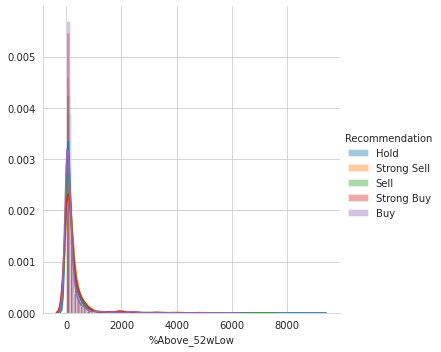

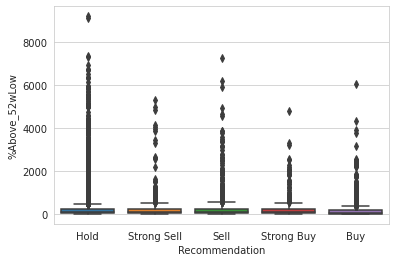

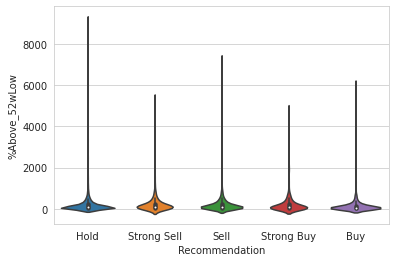

In [107]:
a=np.mean(data['%Above_52wLow'])      

print("mean of the feature '%Above_52wLow' is ",a)
b=np.median(data['%Above_52wLow'])
print("median of feature '%Above_52wLow' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['%Above_52wLow'],75)
print("75th percentile for %Above_52wLow is ",y)

z=np.percentile(data['%Above_52wLow'],25)
print("25th percentile for %Above_52wLow is ",z)


c=np.percentile(sa['%Above_52wLow'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['%Above_52wLow'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['%Above_52wLow'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['%Above_52wLow'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['%Above_52wLow'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['%Above_52wLow'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['%Above_52wLow'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['%Above_52wLow'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['%Above_52wLow'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['%Above_52wLow'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, '%Above_52wLow',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='%Above_52wLow', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='%Above_52wLow', data=data)
plt.show()

#**Conclusion**

1. We have lots of outliers in this features as there is a largegap between mean and median of this feature value and that makes sense in real world stock companies.

2. There is a high overlap in distribution means this feature is not adding any major contribution in classifying classes.

3. Both Box plot and violin plot is very messy and its very difficult to interrrupt anything from it.


# Feature '%Below_52wHigh'


mean of the feature '%Below_52wHigh' is  27.120347917262468
median of feature '%Below_52wHigh' is  18.56
75th percentile for %Below_52wHigh is  41.0775
25th percentile for %Below_52wHigh is  6.0725
75th percentile for hold is  40.73
25th percentile for hold is  5.5
75th percentile for strong sell is 32.51
25th percentile for strong sell is  4.859999999999999
75th percentile for sell is  36.53
25th percentile for sell is  5.66
75th percentile for Buy is  51.855
25th percentile for Buy is  14.965
75th percentile for Strong Buy is  50.67
25th percentile for Strong Buy is  6.98


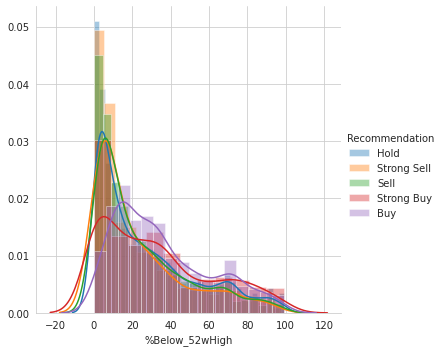

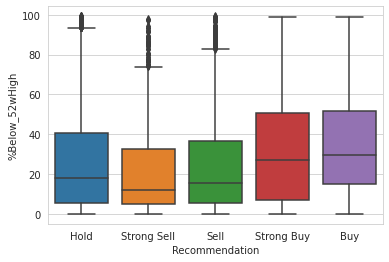

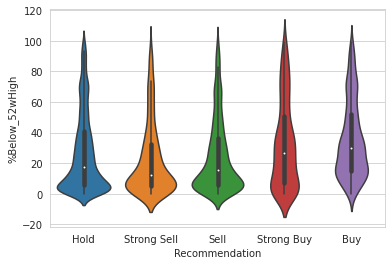

In [108]:
# feature '%Below_52wHigh'

a=np.mean(data['%Below_52wHigh'])      

print("mean of the feature '%Below_52wHigh' is ",a)
b=np.median(data['%Below_52wHigh'])
print("median of feature '%Below_52wHigh' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['%Below_52wHigh'],75)
print("75th percentile for %Below_52wHigh is ",y)

z=np.percentile(data['%Below_52wHigh'],25)
print("25th percentile for %Below_52wHigh is ",z)


c=np.percentile(sa['%Below_52wHigh'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['%Below_52wHigh'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['%Below_52wHigh'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['%Below_52wHigh'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['%Below_52wHigh'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['%Below_52wHigh'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['%Below_52wHigh'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['%Below_52wHigh'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['%Below_52wHigh'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['%Below_52wHigh'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, '%Below_52wHigh',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='%Below_52wHigh', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='%Below_52wHigh', data=data)
plt.show()

#**Conclusion**


1. There is a high overlap in distribution but still we can see some difference in Sell and Buy. This feature can be useful in classifying.

2. Percentiles are also close but we can see clearly that strong sell and sell have close percentile value and strong buy and buy have close perentile value but sell percentiles varies from buy.

3. Violen plot shows that individual distribution of class labels is almost same.



#Feature-'20dma'

mean of the feature '20dma' is  144.13840148698898
median of feature '20dma' is  42.3
75th percentile for 20dma is  139.9575
25th percentile for 20dma is  10.92
75th percentile for hold is  140.34500000000003
25th percentile for hold is  11.01
75th percentile for strong sell is 144.015
25th percentile for strong sell is  11.975000000000001
75th percentile for sell is  155.0375
25th percentile for sell is  12.0075
75th percentile for Buy is  128.5425
25th percentile for Buy is  9.75
75th percentile for Strong Buy is  115.79
25th percentile for Strong Buy is  8.01


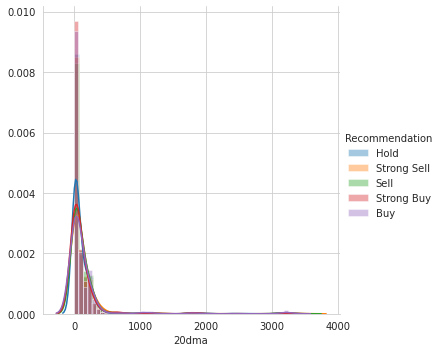

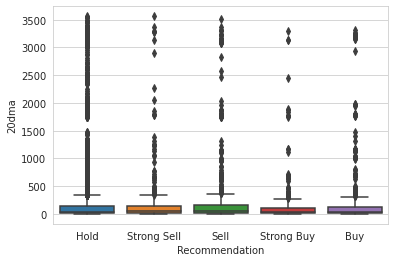

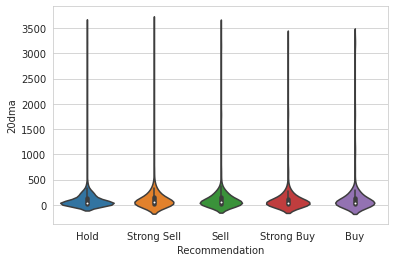

In [109]:

a=np.mean(data['20dma'])      

print("mean of the feature '20dma' is ",a)
b=np.median(data['20dma'])
print("median of feature '20dma' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['20dma'],75)
print("75th percentile for 20dma is ",y)

z=np.percentile(data['20dma'],25)
print("25th percentile for 20dma is ",z)


c=np.percentile(sa['20dma'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['20dma'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['20dma'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['20dma'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['20dma'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['20dma'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['20dma'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['20dma'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['20dma'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['20dma'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, '20dma',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='20dma', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='20dma', data=data)
plt.show()

#Feature -- 50dma

mean of the feature '50dma' is  140.58796921170563
median of feature '50dma' is  40.885000000000005
75th percentile for 50dma is  135.35750000000002
25th percentile for 50dma is  10.95
75th percentile for hold is  135.95499999999998
25th percentile for hold is  10.9925
75th percentile for strong sell is 127.94
25th percentile for strong sell is  11.17
75th percentile for sell is  148.9025
25th percentile for sell is  11.8
75th percentile for Buy is  128.1225
25th percentile for Buy is  10.6175
75th percentile for Strong Buy is  115.0
25th percentile for Strong Buy is  8.58


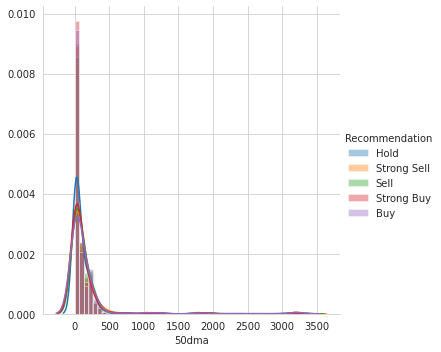

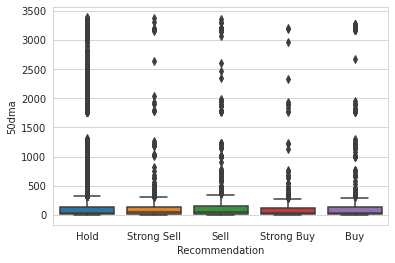

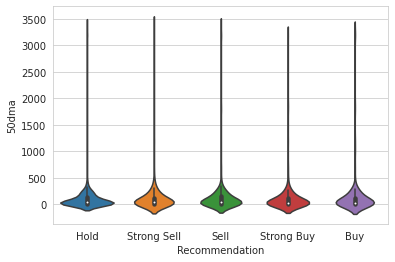

In [110]:

a=np.mean(data['50dma'])      

print("mean of the feature '50dma' is ",a)
b=np.median(data['50dma'])
print("median of feature '50dma' is ",b)

sa=data.loc[data['Recommendation']=='Hold']
sb=data.loc[data['Recommendation']=='Strong Sell']
sc=data.loc[data['Recommendation']=='Sell']
sd=data.loc[data['Recommendation']=='Buy']
se=data.loc[data['Recommendation']=='Strong Buy']


y=np.percentile(data['50dma'],75)
print("75th percentile for 50dma is ",y)

z=np.percentile(data['50dma'],25)
print("25th percentile for 50dma is ",z)


c=np.percentile(sa['50dma'],75)
print("75th percentile for hold is ",c)

n=np.percentile(sa['50dma'],25)
print("25th percentile for hold is ",n)

d=np.percentile(sb['50dma'],75)
print("75th percentile for strong sell is",d)

e=np.percentile(sb['50dma'],25)
print("25th percentile for strong sell is ",e)

f=np.percentile(sc['50dma'],75)
print("75th percentile for sell is ",f)

g=np.percentile(sc['50dma'],25)
print("25th percentile for sell is ",g)

h=np.percentile(sd['50dma'],75)
print("75th percentile for Buy is ",h)

i=np.percentile(sd['50dma'],25)
print("25th percentile for Buy is ",i)

j=np.percentile(se['50dma'],75)
print("75th percentile for Strong Buy is ",j)

k=np.percentile(se['50dma'],25)
print("25th percentile for Strong Buy is ",k)


sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, '50dma',kde='True') \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='50dma', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='50dma', data=data)
plt.show()

#Feature--'130dma'

mean of the feature '130dma' is  131.93393146506543
median of feature '130dma' is  38.644999999999996


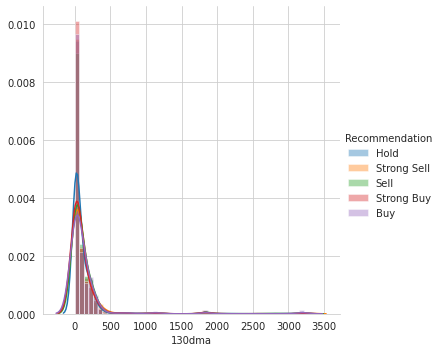

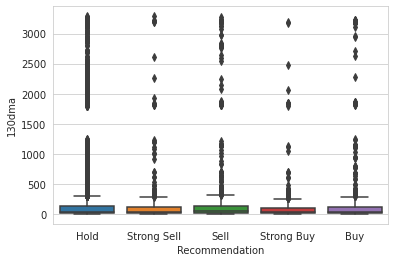

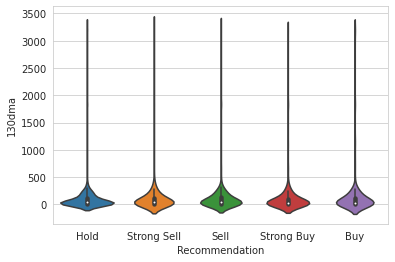

In [111]:
a=np.mean(data['130dma'])      

print("mean of the feature '130dma' is ",a)
b=np.median(data['130dma'])
print("median of feature '130dma' is ",b)



sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, '130dma',kde=True) \
   .add_legend()
plt.show()




sns.boxplot(x='Recommendation',y='130dma', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='130dma', data=data)
plt.show()

#**Conclusion**

1. 20dma,50dma,130dma all three features have highly overlapped distributions, not helping much in classifying the class labels.

2. Percentiles for all 3 features are almost same.



#Features- OPEN,HIGH,LOW

mean of the feature 'Open' is  146.9544042512633
median of feature 'Open' is  43.45


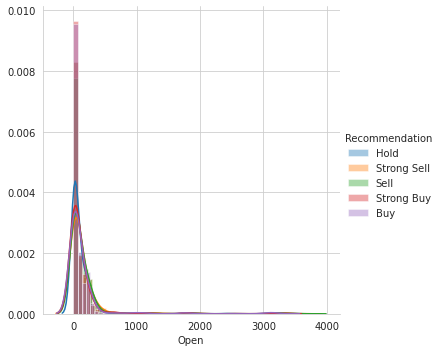

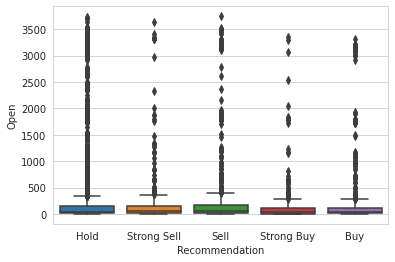

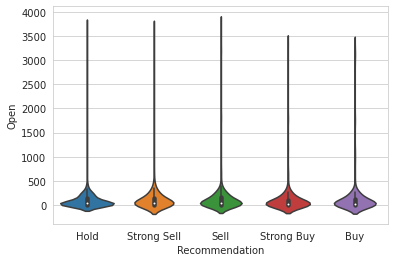

In [112]:
#open
a=np.mean(data['Open'])      

print("mean of the feature 'Open' is ",a)
b=np.median(data['Open'])
print("median of feature 'Open' is ",b)



sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'Open',kde=True) \
   .add_legend()
plt.show()



sns.boxplot(x='Recommendation',y='Open', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='Open', data=data)
plt.show()

mean of the feature 'High' is  149.5462758554963
median of feature 'High' is  44.46


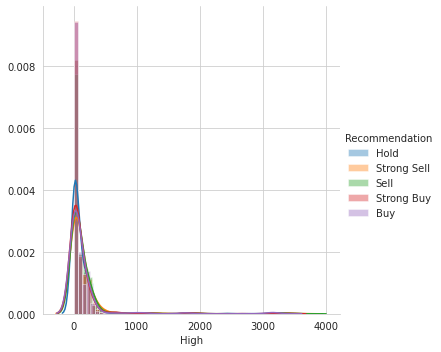

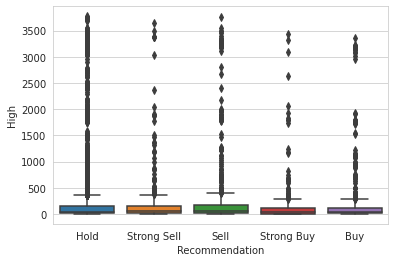

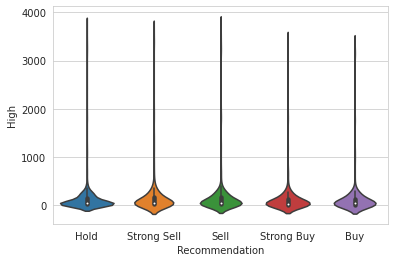

In [113]:
#high
a=np.mean(data['High'])      

print("mean of the feature 'High' is ",a)
b=np.median(data['High'])
print("median of feature 'High' is ",b)



sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'High',kde=True) \
   .add_legend()
plt.show()



sns.boxplot(x='Recommendation',y='High', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='High', data=data)
plt.show()

mean of the feature 'Low' is  144.23506148126924
median of feature 'Low' is  42.31


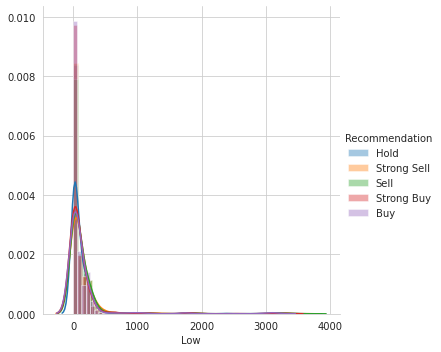

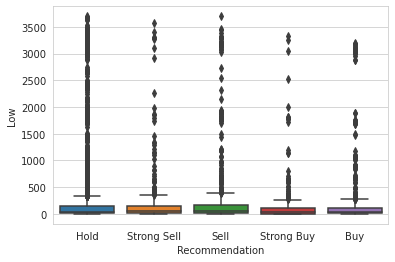

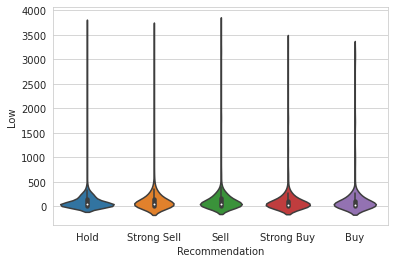

In [114]:
#low
a=np.mean(data['Low'])      

print("mean of the feature 'Low' is ",a)
b=np.median(data['Low'])
print("median of feature 'Low' is ",b)



sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'Low',kde=True) \
   .add_legend()
plt.show()


sns.boxplot(x='Recommendation',y='Low', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='Low', data=data)
plt.show()

#**Conclusion**

1. open,high,low,all three features have highly overlapped distributions, not helping much in classifying the class labels.

2. Percentiles for all 3 features are almost same.


#Feature DI+

mean of the feature 'DI+' is  26.113521589934326
median of feature 'DI+' is  25.45


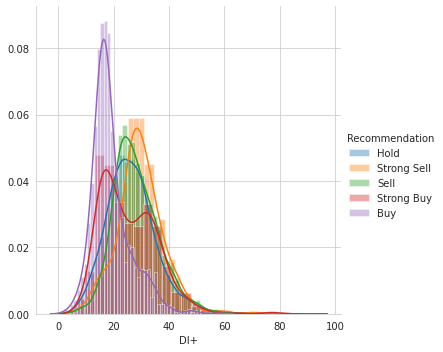

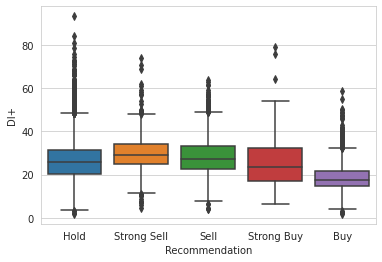

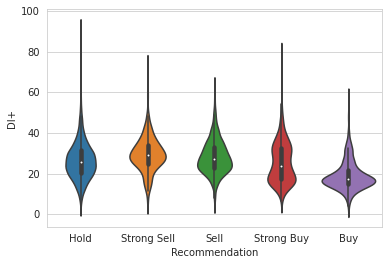

In [115]:
#feature DI+
a=np.mean(data['DI+'])      

print("mean of the feature 'DI+' is ",a)
b=np.median(data['DI+'])
print("median of feature 'DI+' is ",b)



sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'DI+',kde=True) \
   .add_legend()
plt.show()


sns.boxplot(x='Recommendation',y='DI+', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='DI+', data=data)
plt.show()

#Feature --DI-

mean of the feature 'DI-' is  21.70370936993609
median of feature 'DI-' is  20.68


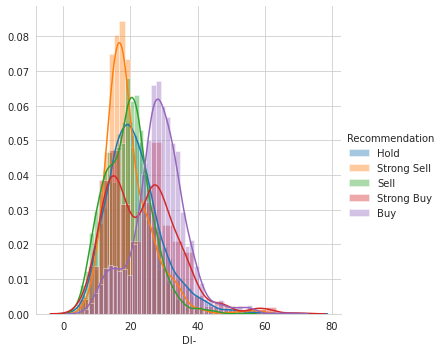

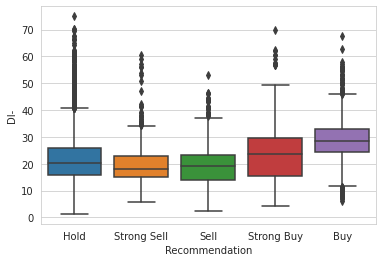

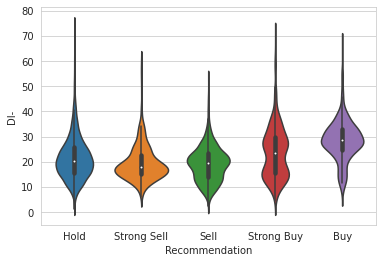

In [116]:
#FEATURE DI-
a=np.mean(data['DI-'])      

print("mean of the feature 'DI-' is ",a)
b=np.median(data['DI-'])
print("median of feature 'DI-' is ",b)



sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'DI-',kde=True) \
   .add_legend()
plt.show()



sns.boxplot(x='Recommendation',y='DI-', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='DI-', data=data)
plt.show()

#**Conclusion**

1. We can clearly see that we have some overlapping in DI+ and DI- but BUY and SELL can be clearly seen seperate distributions , these features can be very useful in classification.

2. In DI+, Sell and Buy have different percentile values, same with DI-.



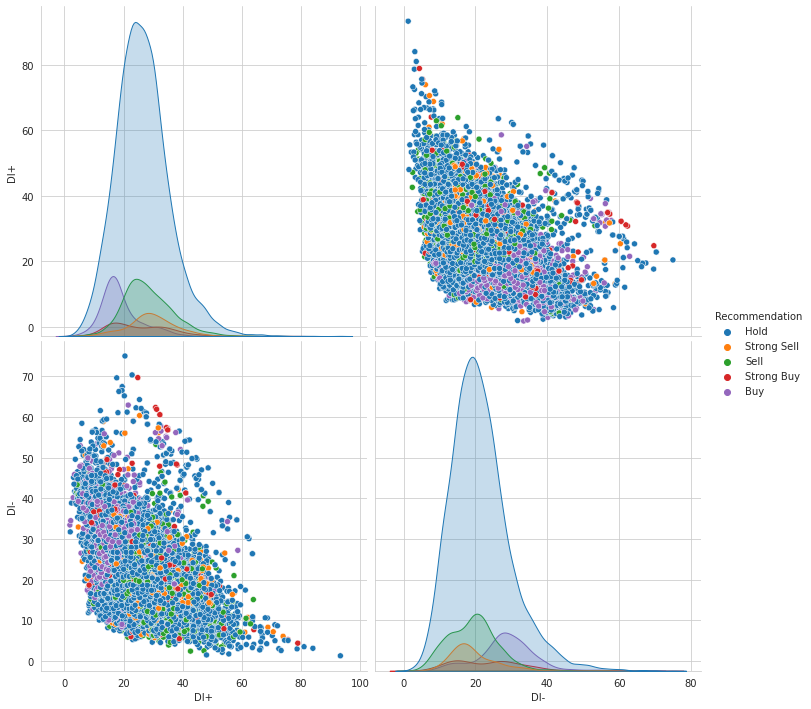

In [117]:
#Pair Plot 

data8=data[['DI+','DI-','Recommendation']]

sns.set_style("whitegrid");
sns.pairplot(data8,hue='Recommendation', size=5);
plt.show()

#Feature -- ADX_Strength

In [118]:
data['ADX_Strength'].head()

0     13days descend
2     11days descend
5      8days descend
13     28days ascend
15     26days ascend
Name: ADX_Strength, dtype: object

ADX_Strength, From domain knowledge, we got to know that this feature can be derived by other features so we can skip these feature.


#Feature-- MACD

In [119]:
data['MACD'].head()

0    -0.04
2     0.00
5     0.10
13    0.37
15    0.47
Name: MACD, dtype: float64

mean of the feature 'MACD' is  1.8017810504241774
median of feature 'MACD' is  0.25


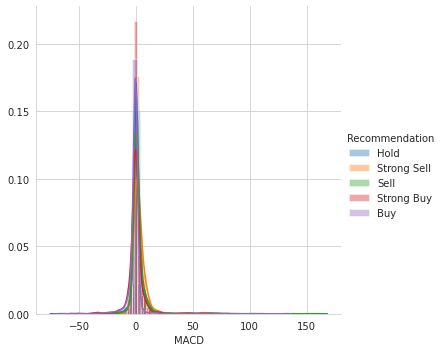

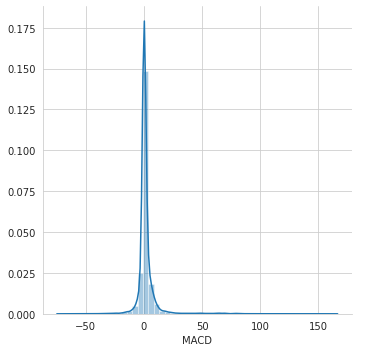

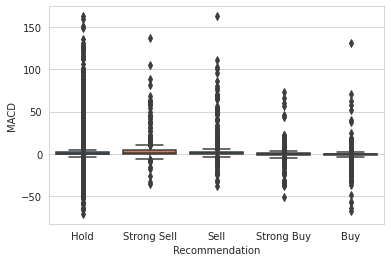

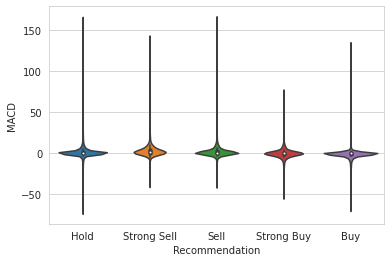

In [120]:
#FEATURE MACD
a=np.mean(data['MACD'])      

print("mean of the feature 'MACD' is ",a)
b=np.median(data['MACD'])
print("median of feature 'MACD' is ",b)



sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'MACD',kde=True) \
   .add_legend()
plt.show()


sns.FacetGrid(data, size=5) \
   .map(sns.distplot, 'MACD',kde=True) \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='MACD', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='MACD', data=data)
plt.show()

#Feature-Signal

In [121]:
data['Signal'].head()

0     0.06
2     0.11
5     0.19
13    0.45
15    0.48
Name: Signal, dtype: float64

mean of the feature 'Signal' is  1.7125336002287757
median of feature 'Signal' is  0.24


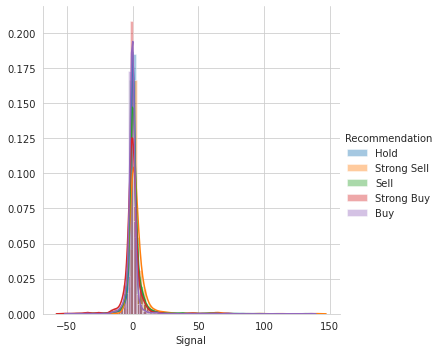

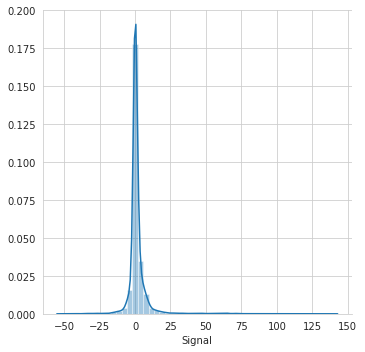

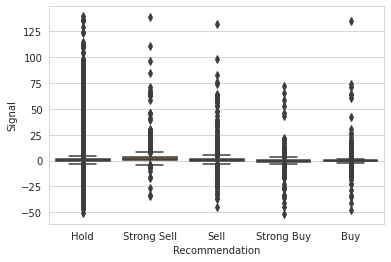

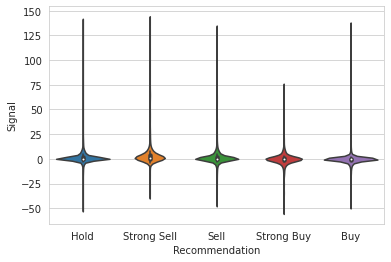

In [122]:
#FEATURE Signal
a=np.mean(data['Signal'])      

print("mean of the feature 'Signal' is ",a)
b=np.median(data['Signal'])
print("median of feature 'Signal' is ",b)



sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'Signal',kde=True) \
   .add_legend()
plt.show()


sns.FacetGrid(data, size=5) \
   .map(sns.distplot, 'Signal',kde=True) \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='Signal', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='Signal', data=data)
plt.show()

#Feature - Histogram

mean of the feature 'Histogram' is  0.08924745019540568
median of feature 'Histogram' is  0.02


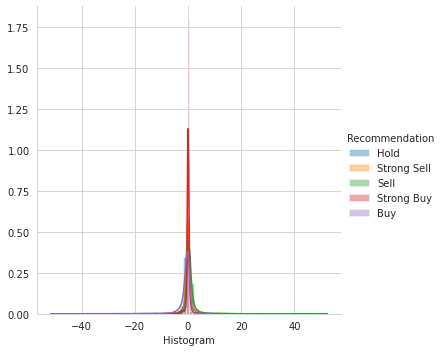

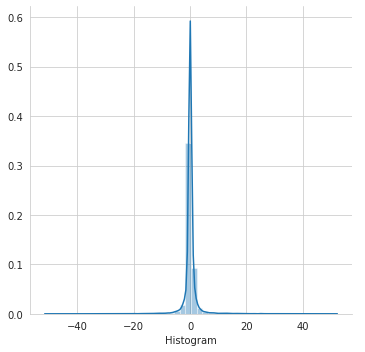

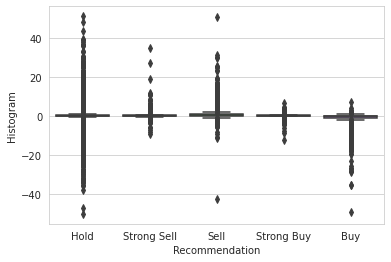

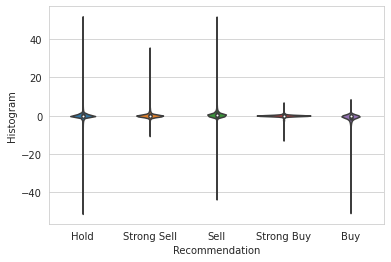

In [123]:
#FEATURE Histogram
a=np.mean(data['Histogram'])      

print("mean of the feature 'Histogram' is ",a)
b=np.median(data['Histogram'])
print("median of feature 'Histogram' is ",b)



sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'Histogram',kde=True) \
   .add_legend()
plt.show()


sns.FacetGrid(data, size=5) \
   .map(sns.distplot, 'Histogram',kde=True) \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='Histogram', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='Histogram', data=data)
plt.show()

#Feature--'Volume'

mean of the feature 'Volume' is  9494685.596415976
median of feature 'Volume' is  2261250.0


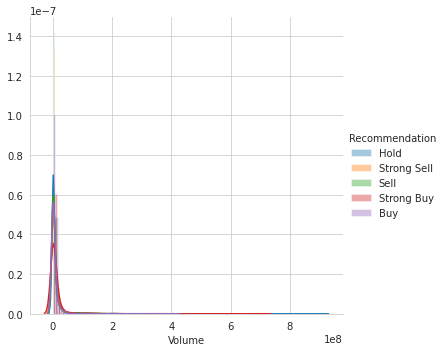

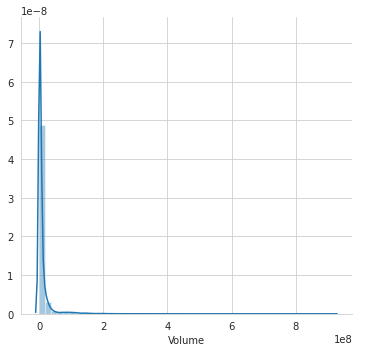

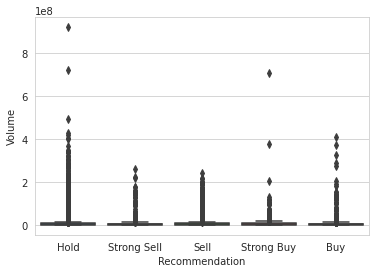

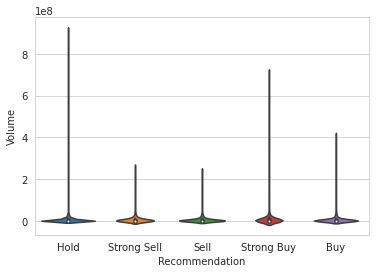

In [124]:
#FEATURE DI-
a=np.mean(data['Volume'])      

print("mean of the feature 'Volume' is ",a)
b=np.median(data['Volume'])
print("median of feature 'Volume' is ",b)



sns.FacetGrid(data, hue="Recommendation", size=5) \
   .map(sns.distplot, 'Volume',kde=True) \
   .add_legend()
plt.show()


sns.FacetGrid(data, size=5) \
   .map(sns.distplot, 'Volume',kde=True) \
   .add_legend()
plt.show()

sns.boxplot(x='Recommendation',y='Volume', data=data)
plt.show()

sns.violinplot(x='Recommendation', y='Volume', data=data)
plt.show()

#Feature-- Stochastic Interpretation

In [125]:
data['Stochastic_Interpretation'].value_counts()

Overbought    5605
Oversold      3461
Name: Stochastic_Interpretation, dtype: int64

In [126]:
data['Stochastic_Interpretation'].isnull().sum()
#we have a lots of null values in this feature, lets fill this feature by simple "No interpretation"

11916

In [127]:
data['Stochastic_Interpretation']=data['Stochastic_Interpretation'].fillna("No Interpretation")

In [128]:
data['Stochastic_Interpretation'].value_counts()

No Interpretation    11916
Overbought            5605
Oversold              3461
Name: Stochastic_Interpretation, dtype: int64

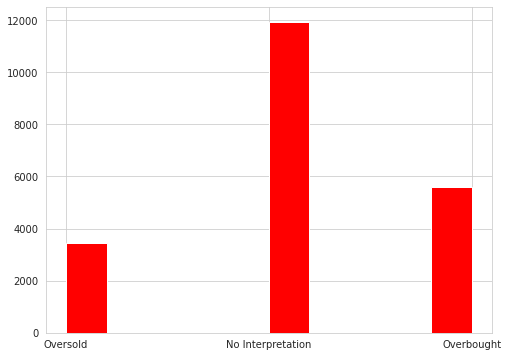

In [129]:
plt.figure(figsize=(8,6))
plt.hist(data['Stochastic_Interpretation'],facecolor='r')
plt.show()


#OVERSOLD

In [130]:
#lets find out the trend in  Oversold
df1=data[(data['Stochastic_Interpretation']=='Oversold') & (data['Recommendation']=='Hold')]
df2=data[(data['Stochastic_Interpretation']=='Oversold') & (data['Recommendation']=='Strong Sell')]
df3=data[(data['Stochastic_Interpretation']=='Oversold') & (data['Recommendation']=='Sell')]
df4=data[(data['Stochastic_Interpretation']=='Oversold') & (data['Recommendation']=='Strong Buy')]
df5=data[(data['Stochastic_Interpretation']=='Oversold') & (data['Recommendation']=='Buy')]

In [131]:
#oversold and hold
a=df1[['Stochastic_Interpretation','Recommendation']].count()
print(a)
print("% of hold in oversold =", (2206/3461)*100)

#oversold and Strong Sell
b=df2[['Stochastic_Interpretation','Recommendation']].count()
print(b)
print("% of Strong Sell in oversold =", (44/3461)*100)

#oversold and sell
c=df3[['Stochastic_Interpretation','Recommendation']].count()
print(c)
print("% of Sell in oversold =", (75/3461)*100)

#oversold and Strong Buy
d=df4[['Stochastic_Interpretation','Recommendation']].count()
print(d)
print("% of Strong Buy in oversold =", (161/3461)*100)

#oversold and Buy
e=df5[['Stochastic_Interpretation','Recommendation']].count()
print(e)
print("% of Buy in oversold =", (975/3461)*100)


Stochastic_Interpretation    2206
Recommendation               2206
dtype: int64
% of hold in oversold = 63.738803813926616
Stochastic_Interpretation    44
Recommendation               44
dtype: int64
% of Strong Sell in oversold = 1.2713088702687085
Stochastic_Interpretation    75
Recommendation               75
dtype: int64
% of Sell in oversold = 2.1670037561398443
Stochastic_Interpretation    161
Recommendation               161
dtype: int64
% of Strong Buy in oversold = 4.651834729846866
Stochastic_Interpretation    975
Recommendation               975
dtype: int64
% of Buy in oversold = 28.171048829817973


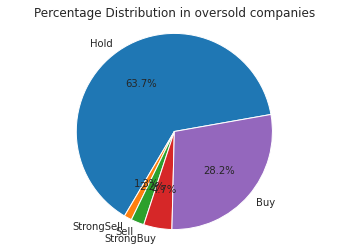

In [132]:
#pie chart
labels = 'Hold', 'StrongSell', 'Sell', 'StrongBuy', 'Buy'
sizes = [63.73, 1.27, 2.167, 4.65,28.17]

fig1, ax1 = plt.subplots()
ax1.pie(sizes,labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=10)
ax1.axis('equal')  
plt.title("Percentage Distribution in oversold companies")
plt.show()

#overbought

In [133]:
#lets find out the trend in overbought
df1=data[(data['Stochastic_Interpretation']=='Overbought') & (data['Recommendation']=='Hold')]
df2=data[(data['Stochastic_Interpretation']=='Overbought') & (data['Recommendation']=='Strong Sell')]
df3=data[(data['Stochastic_Interpretation']=='Overbought') & (data['Recommendation']=='Sell')]
df4=data[(data['Stochastic_Interpretation']=='Overbought') & (data['Recommendation']=='Strong Buy')]
df5=data[(data['Stochastic_Interpretation']=='Overbought') & (data['Recommendation']=='Buy')]

In [134]:
#Overbought and hold
a=df1[['Stochastic_Interpretation','Recommendation']].count()
print(a)
print("% of hold in overbought =", (3891/5605)*100)

#Overbought and Strong Sell
b=df2[['Stochastic_Interpretation','Recommendation']].count()
print(b)
print("% of Strong Sell in overbought =", (309/5605)*100)

#Overbought and sell
c=df3[['Stochastic_Interpretation','Recommendation']].count()
print(c)
print("% of Sell in overbought =", (1225/5605)*100)

#Overbought and Strong Buy
d=df4[['Stochastic_Interpretation','Recommendation']].count()
print(d)
print("% of Strong Buy in overbought =", (125/5605)*100)

#Overbought and Buy
e=df5[['Stochastic_Interpretation','Recommendation']].count()
print(e)
print("% of Buy in overbought =", (55/5605)*100)


Stochastic_Interpretation    3891
Recommendation               3891
dtype: int64
% of hold in overbought = 69.42016057091882
Stochastic_Interpretation    309
Recommendation               309
dtype: int64
% of Strong Sell in overbought = 5.512934879571811
Stochastic_Interpretation    1225
Recommendation               1225
dtype: int64
% of Sell in overbought = 21.855486173059766
Stochastic_Interpretation    125
Recommendation               125
dtype: int64
% of Strong Buy in overbought = 2.230151650312221
Stochastic_Interpretation    55
Recommendation               55
dtype: int64
% of Buy in overbought = 0.9812667261373774


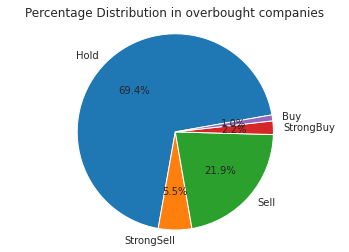

In [135]:
#pie chart
labels = 'Hold', 'StrongSell', 'Sell', 'StrongBuy', 'Buy'
sizes = [69.42, 5.51, 21.85, 2.23,0.98]

fig1, ax1 = plt.subplots()
ax1.pie(sizes,labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=10)
ax1.axis('equal')  
plt.title("Percentage Distribution in overbought companies")
plt.show()

In [136]:
#No_Interpretation
df1=data[(data['Stochastic_Interpretation']=='No Interpretation') & (data['Recommendation']=='Hold')]
df2=data[(data['Stochastic_Interpretation']=='No Interpretation') & (data['Recommendation']=='Strong Sell')]
df3=data[(data['Stochastic_Interpretation']=='No Interpretation') & (data['Recommendation']=='Sell')]
df4=data[(data['Stochastic_Interpretation']=='No Interpretation') & (data['Recommendation']=='Strong Buy')]
df5=data[(data['Stochastic_Interpretation']=='No Interpretation') & (data['Recommendation']=='Buy')]

In [137]:
#No Interpretation and hold
a=df1[['Stochastic_Interpretation','Recommendation']].count()
print(a)
print("% of hold in No Interpretation =", (9177/11916)*100)

#No Interpretation and Strong Sell
b=df2[['Stochastic_Interpretation','Recommendation']].count()
print(b)
print("% of Strong Sell in No Interpretation =", (582/11916)*100)

#No Interpretation and sell
c=df3[['Stochastic_Interpretation','Recommendation']].count()
print(c)
print("% of Sell in No Interpretation =", (1130/11916)*100)

#No Interpretation and Strong Buy
d=df4[['Stochastic_Interpretation','Recommendation']].count()
print(d)
print("% of Strong Buy in No Interpretation =", (415/11916)*100)

#No Interpretation and Buy
e=df5[['Stochastic_Interpretation','Recommendation']].count()
print(e)
print("% of Buy in No Interpretation =", (612/11916)*100)


Stochastic_Interpretation    9177
Recommendation               9177
dtype: int64
% of hold in No Interpretation = 77.01409869083585
Stochastic_Interpretation    582
Recommendation               582
dtype: int64
% of Strong Sell in No Interpretation = 4.884189325276939
Stochastic_Interpretation    1130
Recommendation               1130
dtype: int64
% of Sell in No Interpretation = 9.483048002685464
Stochastic_Interpretation    415
Recommendation               415
dtype: int64
% of Strong Buy in No Interpretation = 3.4827123195703256
Stochastic_Interpretation    612
Recommendation               612
dtype: int64
% of Buy in No Interpretation = 5.13595166163142


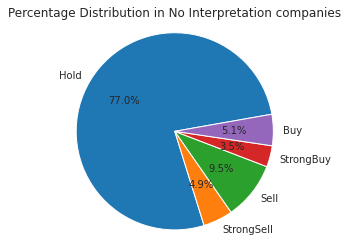

In [138]:
#pie chart
labels = 'Hold', 'StrongSell', 'Sell', 'StrongBuy', 'Buy'
sizes = [77.01, 4.88, 9.48, 3.48,5.13]

fig1, ax1 = plt.subplots()
ax1.pie(sizes,labels=labels, autopct='%1.1f%%',
        shadow=False, startangle=10)
ax1.axis('equal')  
plt.title("Percentage Distribution in No Interpretation companies")
plt.show()

#**Conclusion**

Oversold , Overbought and No Interpretation have different percentage distribution of class labels ,it means it could be a feature which can help in classfying class labels.

# Feature -- 'ADX_Interpretation'



In [139]:
data['ADX_Interpretation'].value_counts()

Trend weakening                                   6258
Trend strengthening                               5920
Uptrend Strengthening                             2917
Uptrend Weakening                                 2200
DownTrend Strengthening                           1282
DownTrend Weakening                                930
Trend reversing from Downtrend to Uptrend          696
Sell:DI- greater than DI+ signifying Downtrend     223
Strong Uptrend                                     165
Buy:DI+ greater than DI- signifying Uptrend        162
Downtrend Weakening                                109
Strong Downtrend                                    70
Week trend, Use oscillators                         35
Week trend                                           4
SELL-Very Strong Downtrend                           3
BUY-Very Strong Uptrend                              1
Name: ADX_Interpretation, dtype: int64

This feature has been added manually in the data to understand ADX feature well and also this has much more categories, we can skip this feature, it will be in correlation withADX feature.


---



---



---



All other features like MFI_Interpretation, 'Histogram_Interpretation_previousday',
 'MACD_Change%' and others are not important as per domain knowledge or can be derived from other features so we can skip those features. 

# **Dimension Reduction**
Dimension reduction is a very wonderful technique to visualize data in lower dimension.

Mainly there are two techniques which i gonna use in this project that is

PCA(stands for Principle component analysis) The idea is very simply, we want to find the direction f' such that variance of projection of xi's over f' is maximum, here xi's are the data points.

T-sne is a complex idea, but intutively it tries to embedd higher dimensional points to lower dimensions so that its easy to visualize them. TSNE Stands for t distribution stochastic neighbourhood embedding.


---



---



---



In [140]:
#we took only important features which were used to derive rule based system
datasne=data[['Close', 'Change%','52wLow', '52wHigh', 'ADX', 
              'Histogram','Signal','RSI','Open','High','Low','DI+','DI-','Volume']]

In [197]:

from sklearn.manifold import TSNE
x=TSNE(n_components=2,perplexity=50.0,learning_rate=200.0, n_iter=5000).fit_transform(datasne)


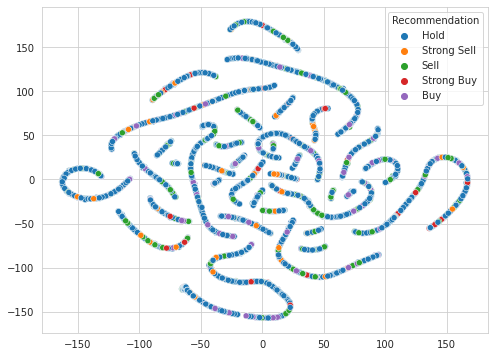

In [198]:

fig_dims = (8, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sns.scatterplot(x[:,0],x [:,1], hue=data["Recommendation"], legend='full',ax=ax)
plt.show()

# **Conclusion of T-SNE**

1. There are no perfect clusters after applying TSNE.

2. There are few places where we can see same colours clusters but nothing is very clear.

3. So TSNE does not help much in this case.

#**PCA**

In [144]:
#Let's use PCA
#for all the companies, not for indivudual company
from sklearn import decomposition
pca=decomposition.PCA()
pca.n_components=2
pdata=pca.fit_transform(datasne)
print(datasne.shape)
print(pdata.shape)

(20982, 14)
(20982, 2)


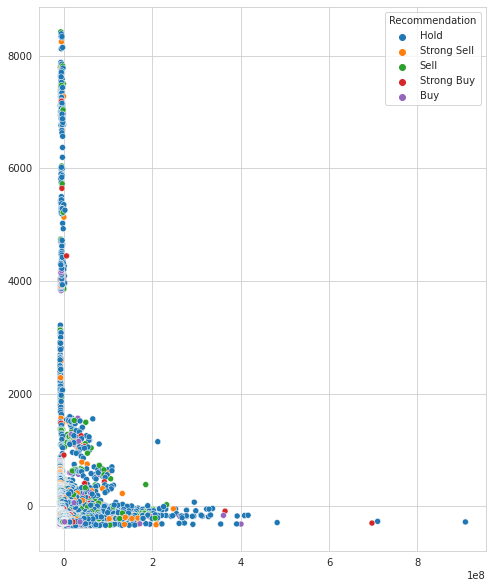

In [145]:
#plotting PCA result
fig_dims = (8, 10)
fig, ax = plt.subplots(figsize=fig_dims)
sns.scatterplot(pdata[:,0],pdata [:,1], hue=data["Recommendation"], legend='full',ax=ax)
plt.show()

#**Conclusion OF PCA**

1. No perfect clustering can be observed after reducing the dimension through PCA.

2. Small green clusters(sell) can be seen between 0 and 1,purple clusters can been seen near 1(buy), So a clear difference can be seen between buy and sell in range 0 to 1.

3. Though hold values are all over the place but that make sense in Real World, as we buy a stock, for sometime we hold that stock and when it moves up by a certain margin, we sell the stock, that is the basic cycle.

4. We can observe that orange points generally occuring near green points because sell and strong sell should be close by.




From EDA and domain knowledge we got to know that out of 64 features only 19 are important features for recommendation.



In [146]:
df=data[['Recommendation', 'Close',
             'ADX','ADX_Change%',
             'William%R', 'RSI',
             '%K(Smooth)', '%D(Smooth)',
             '%Above_52wLow', '%Below_52wHigh', '20dma',
             '50dma', 'Signal', 'Histogram',
             'MACD', 'Open', 'High', 'Low', 
             'DI+', 'DI-']]

In [147]:
df.shape

(20982, 20)

In [148]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20982 entries, 0 to 41068
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Recommendation  20982 non-null  object 
 1   Close           20982 non-null  float64
 2   ADX             20982 non-null  float64
 3   ADX_Change%     20982 non-null  float64
 4   William%R       20982 non-null  float64
 5   RSI             20982 non-null  float64
 6   %K(Smooth)      20982 non-null  float64
 7   %D(Smooth)      20982 non-null  float64
 8   %Above_52wLow   20982 non-null  float64
 9   %Below_52wHigh  20982 non-null  float64
 10  20dma           20982 non-null  float64
 11  50dma           20982 non-null  float64
 12  Signal          20982 non-null  float64
 13  Histogram       20982 non-null  float64
 14  MACD            20982 non-null  float64
 15  Open            20982 non-null  float64
 16  High            20982 non-null  float64
 17  Low             20982 non-null 

In [149]:
df['Recommendation'].value_counts()

Hold           15274
Sell            2430
Buy             1642
Strong Sell      935
Strong Buy       701
Name: Recommendation, dtype: int64

In [150]:
y=df.iloc[:,0:1]
X=df.iloc[:,1:20]

In [151]:
X.columns #feature names

Index(['Close', 'ADX', 'ADX_Change%', 'William%R', 'RSI', '%K(Smooth)',
       '%D(Smooth)', '%Above_52wLow', '%Below_52wHigh', '20dma', '50dma',
       'Signal', 'Histogram', 'MACD', 'Open', 'High', 'Low', 'DI+', 'DI-'],
      dtype='object')

In [152]:
y.columns #this is the target variable

Index(['Recommendation'], dtype='object')

In [153]:
#spliting the data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.3, random_state=42)

Training data is used to train the Machine Learning model.

In [154]:
print(X_train.shape)
print(y_train.shape)

(14687, 19)
(14687, 1)


In [155]:
print(X_test.shape)
print(y_test.shape)

(6295, 19)
(6295, 1)


In [156]:
y_train['Recommendation'].value_counts()

Hold           10648
Sell            1716
Buy             1161
Strong Sell      669
Strong Buy       493
Name: Recommendation, dtype: int64

Test data is to test the performance of the the Machine Learning model.

Here we are using SMOTE technique on training data, SMOTE algorithm synthetically produces samples using KNN(K nearest neighbour) algorithm, so it understands the local behaviour of a particular class label and try to produce synthetic rows according to that behaviour.


In [157]:
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE
strategy = {'Buy':2000, 'Hold':10648, 'Sell':2000, 'Strong Buy':1500, 'Strong Sell':1500}
#we want Buy and Sell rows to be 2500 and Strong Buy and Strong Sell to be 1500
oversample = SMOTE(sampling_strategy=strategy)
Xsmote, ysmote = oversample.fit_resample(X_train, y_train)


In [158]:
print(Xsmote.shape)
print(ysmote.shape)

(17648, 19)
(17648,)


We still have data imabalance in the data but that is the nature of original data we have in real world,
We can do more balancing of data but then Machine Learning model wont be able to handle that in real world data.

('Hold', 10648, 60.335448776065284)
('Sell', 2000, 11.332728921124206)
('Buy', 2000, 11.332728921124206)
('Strong Buy', 1500, 8.499546690843154)
('Strong Sell', 1500, 8.499546690843154)


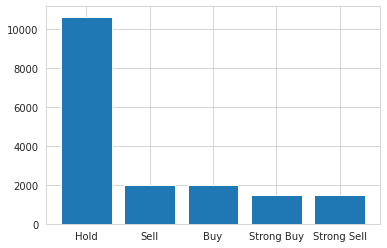

In [159]:
from collections import Counter
counter = Counter(ysmote)
for k,v in counter.items():
	per = v / len(ysmote) * 100
	print((k, v, per))
# plot the distribution
plt.bar(counter.keys(), counter.values())
plt.show()

#**Logistic Regression(SMOTE)**

In [202]:
#we are using simple gridsearchcv to tune the hyperparameter C
#here we are using smote samples
tuned_parameters=[{'C':[10**-4,10**-2,10**0,10**2,10**4]}]

LRmodel=GridSearchCV(LogisticRegression(max_iter=400),tuned_parameters)

LRmodel.fit(Xsmote,ysmote)

print(LRmodel.best_estimator_)
print(LRmodel.score(X_test,y_test))

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=400,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
0.7194598888006354


We got around 72% accuracy but to check how it is behaving on minority class we will find f1_macro.

In [203]:
#predictions
LR_testsmote_prediction=LRmodel.predict(X_test)
LR_trainsmote_predictions=LRmodel.predict(Xsmote)

In [207]:
#evaluation of Logistic Regression with smote
from sklearn.metrics import f1_score
X_lrtest_F1score=f1_score(y_test,LR_testsmote_prediction,average='macro')
print("Testing f1 score is",X_lrtest_F1score) #f1 score on test data

X_lrtrain_F1score=f1_score(ysmote,LR_trainsmote_predictions,average='macro')
print("Training f1 score is",X_lrtrain_F1score) #f1 score on train data

Testing f1 score is 0.28626946720547786
Training f1 score is 0.28349230371308737


F1_macro is really very bad, it means model is not able to classify minority class labels.

#**Logistic Regression**

In [210]:
#we are using simple gridsearchcv to tune the hyperparameter C
#here we are not using smote samples
tuned_parameters=[{'C':[10**-4,10**-2,10**0,10**2,10**4]}]

LRmodel=GridSearchCV(LogisticRegression(max_iter=400),tuned_parameters)

LRmodel.fit(X_train,y_train)

print(LRmodel.best_estimator_)
print(LRmodel.score(X_test,y_test))

LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=400,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
0.7350277998411437


In [213]:
#predictions
LR_test_prediction=LRmodel.predict(X_test)
LR_train_predictions=LRmodel.predict(X_train)

In [217]:
#evaluation of Logistic Regression without smote
from sklearn.metrics import f1_score
X_lrtest_F1score=f1_score(y_test,LR_test_prediction,average='macro')
print("Testing f1 score is",X_lrtest_F1score) #f1 score on test data

X_lrtrain_F1score=f1_score(y_train,LR_train_predictions,average='macro')
print("Training f1 score is",X_lrtrain_F1score) #f1 score on train data

Testing f1 score is 0.23506666195659504
Training f1 score is 0.2395521861200946


That's again a very bad F1_macro score, Logistic Regression is not working here for sure.

#**Random Forest(smote)**

Lets begin the model training, we will start with Random Forest Model

In [160]:
#Training random forest after applying SMOTE technique.
#here we are using GridSearchCV to tune the hyperparamters we have in randomforest to see which 
# parameters works best.
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [200,300, 500],
    'max_depth' : [4,5,6]
}
rfc=RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(estimator = rfc, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)


In [ ]:
#here we are fiting the training data

grid_search.fit(Xsmotes, ysmotes)
print(grid_search.best_params_)



We got the best hyperparameters, now we will train the random forest model on these parameters

In [161]:
#training the random forest model
rfc_new=RandomForestClassifier(criterion= 'entropy', max_depth= 6, max_features= 'auto', n_estimators=200,random_state=42)
random_forest_model_smote=rfc_new.fit(Xsmote,ysmote)

In [162]:
#predictions
smote_predictions_test=random_forest_model_smote.predict(X_test)
smote_predictions_train=random_forest_model_smote.predict(Xsmote)

In [163]:
#evaluation of random forest with smote
from sklearn.metrics import f1_score
X_test_F1score=f1_score(y_test,smote_predictions_test,average='macro')
print("Testing f1 score is",X_test_F1score) #f1 score on test data

X_train_F1score=f1_score(ysmote,smote_predictions_train,average='macro')
print("Training f1 score is",X_train_F1score) #f1 score on train data

Testing f1 score is 0.5579539481012452
Training f1 score is 0.5755710548443995


Test and train F1 score is very low, we will try some other method.

We had an imbalanced data, that is the reason we are using f1macro, f1 macro penalizes more on minority classes.


---



#**GBDT(smote)**

Lets check how smote technique working with gbdt.
(Gradient Boosting Decision Tree)

In [164]:
import os
from xgboost import XGBClassifier
param_test1 = {'max_depth':[8,9,10],
                'min_child_weight':[2,3,4],
                'learning_rate':[0.05,0.10]}

gbdt_model_grid = GridSearchCV(estimator = XGBClassifier( eval_metric='mlogloss',
n_estimators=200, max_depth=5,
min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
objective= 'multi:softmax', nthread=4, scale_pos_weight=1, seed=27), 
param_grid = param_test1, scoring='f1_micro',iid=False, cv=3)



In [ ]:
gbdt_model_grid.fit(Xsmote,ysmote)
print(gbdt_model_grid.best_estimator_)

In [165]:
Xsmote=pd.DataFrame(data=Xsmote,columns=['Close', 'ADX', 'ADX_Change%', 'William%R', 'RSI',
       '%K(Smooth)', '%D(Smooth)', '%Above_52wLow', '%Below_52wHigh', '20dma',
       '50dma', 'Signal', 'Histogram', 'MACD', 'Open', 'High', 'Low', 'DI+',
       'DI-'])

In [166]:
ysmote=pd.DataFrame(data=ysmote,columns=['Recommendation'])

In [167]:
#training the gbdt model with tuned parameters
gbdt_smote=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, eval_metric='mlogloss',
              gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=10,
              min_child_weight=2, missing=None, n_estimators=200, n_jobs=1,
              nthread=4, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=27,
              silent=None, subsample=0.8, verbosity=1)
gbdt_model_smote=gbdt_smote.fit(Xsmote,ysmote)

In [168]:
#predictions
prediction_gbdtsmote_train=gbdt_model_smote.predict(Xsmote)
prediction_gbdtsmote_test=gbdt_model_smote.predict(X_test)


In [169]:
#let's evaluate gbdt after applying smote

X_train_F1score_gbdt=f1_score(ysmote,prediction_gbdtsmote_train,average='macro')
print("training f1 score for gbdt(smoke)",X_train_F1score_gbdt) #f1 score on train data


X_test_F1score_gbdt=f1_score(y_test,prediction_gbdtsmote_test,average='macro')
print("testing f1 score for gbdt(smoke)",X_test_F1score_gbdt) #f1 score on train data

training f1 score for gbdt(smoke) 1.0
testing f1 score for gbdt(smoke) 0.7854262874928524


In [170]:
y_test['Recommendation'].value_counts()

Hold           4626
Sell            714
Buy             481
Strong Sell     266
Strong Buy      208
Name: Recommendation, dtype: int64

In [171]:
y_test.shape

(6295, 1)

In [172]:
#test
from sklearn.metrics import multilabel_confusion_matrix
multilabel_confusion_matrix(y_test,prediction_gbdtsmote_test ,
                          labels=["Buy", "Hold", "Sell","Strong Buy","Strong Sell"])

array([[[5716,   98],
        [ 120,  361]],

       [[1164,  505],
        [ 315, 4311]],

       [[5436,  145],
        [ 311,  403]],

       [[6045,   42],
        [  50,  158]],

       [[5981,   48],
        [  42,  224]]])

#**Conclusion of Confusion Matrix(Test)--GBDT(SMOTE)**
Total test data we have (6295 rows)
(RBS MEANS RULE BASED SYSTEM)

Buy(481 rows in test data)
1. 361 times when rule based system is giving buy signal, ml model is also giving buy signal,(TRUE POSITIVE).

2. 120 times when rule based system is giving Buy signal, ml model is giving Not Buy signal(FALSE NEGATIVE).


3. 5716 times when RBS is  giving NOT Buy signal, ml model is also giving Not Buy signal(TRUE NEGATIVE).

4.  98 times when RBS is giving NOT Buy signal, ml model is giving Buy signal(FALSE POSITIVE).


---
Sell(714 rows in test data)
1. 403 times when rule based system is giving Sell signal, ml model is also giving Sell signal.(TRUE POSITIVES).

2. 311 times when rule based system is giving Sell signal, ml model is giving Not Sell signal(FALSE NEGATIVE).

3. 5436 times when RBS is  giving NOT Sell signal, ml model is also giving Not Sell signal(TRUE NEGATIVE).

4. 145 times when RBS is giving NOT Sell signal, ml model is giving Sell signal(FALSE POSITIVE)
.

---
STRONG BUY(208 rows in test data)
1. 224 times when rule based system is giving STRONG Buy signal, ml model is also giving Strong Buy signal.(TRUE POSITIVES).

2. 42 times when rule based system is giving Strong Buy signal, ml model is giving Not Strong Buy signal(FALSE NEGATIVE).

3. 6045 time when RBS is  giving NOT Strong Buy signal, ml model is also giving Not Strong Buy signal(TRUE NEGATIVE).

4.  42 times when RBS is giving Strong NOT Buy signal, ml model is giving Strong Buy signal(FALSE POSITIVE).



---

STRONG SELL(266 rows in test data)
1. 206 times when rule based system is giving STRONG SELL signal, ml model is also giving Strong SELL signal.(TRUE POSITIVES).

2. 57 times when rule based system is giving Strong SELL signal, ml model is giving Not Strong SELL signal(FALSE NEGATIVE).

3. 5981 time when RBS is  giving NOT Strong SELL signal, ml model is also giving Not Strong SELL signal(TRUE NEGATIVE).

4.  48 times when RBS is giving NOT Strong Sell signal, ml model is giving Strong Sell signal(FALSE POSITIVE).



---



---



#**RandomForest**

Let's try some other method,
Let's use inbuild parameter "class_weight" to balance imbalance classes.

In [173]:
#lets train random forest without using smote technique

#here we are GridSearchCV to tune the hyperparamters we have in randomforest to see which 
# parameters works best.
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [200,300, 500],
    'max_depth' : [4,5,6]
}
rfc3=RandomForestClassifier(class_weight='balanced',random_state=42)
#here parameter class_weight='balanced' will balance the class imbalances

grid_searchcw = GridSearchCV(estimator = rfc3, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)


In [ ]:
grid_searchcw.fit(X_train, y_train)
print(grid_searchcw.best_params_)

In [174]:
#training rf with tuned parameters(only class weights)
from sklearn.ensemble import RandomForestClassifier
rfc3=RandomForestClassifier(class_weight='balanced',criterion= 'entropy', max_depth= 6, max_features= 'auto', n_estimators=300,random_state=42)
random_forest_modelcw=rfc3.fit(X_train,y_train)

In [175]:
X_test_predictcw=random_forest_modelcw.predict(X_test)
X_train_predictcw=random_forest_modelcw.predict(X_train)

In [176]:
#class weights
from sklearn.metrics import f1_score
X_test_F1score=f1_score(y_test,X_test_predictcw,average='macro')
print("Test F1 score for random forest is",X_test_F1score) #f1 score on test data

X_train_F1score=f1_score(y_train,X_train_predictcw,average='macro')
print("Train F1 score for random forest is",X_train_F1score) #f1 score on train data

Test F1 score for random forest is 0.5129529677854754
Train F1 score for random forest is 0.5423199800806777


Now test f1 score is very less, lets try gb
dt(XGBOOST algorithm)

#**GBDT**

In [177]:
#grid search with xgboost(without smote)
import os
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.utils import class_weight

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=50)
param_test1 = {'max_depth':[8,9],
                'min_child_weight':[2,4],
                'learning_rate':[0.05,0.10],
                'n_estimators':[200,300,500]}

classes_weights = class_weight.compute_sample_weight(class_weight='balanced',y=y_train)

gbdt_model_grid = GridSearchCV(estimator = XGBClassifier( eval_metric='mlogloss',
gamma=0, subsample=0.8, colsample_bytree=0.8,
objective= 'multi:softmax', nthread=4, scale_pos_weight=classes_weights, seed=27), 
param_grid = param_test1, scoring='f1_macro',iid=False, cv=3)

In [ ]:
gbdt_model_grid.fit(X_train,y_train)
print(gbdt_model_grid.best_estimator_)

In [178]:
#XGBOOST WITH CLASS WEIGHTS and without smote
import os
from xgboost import XGBClassifier
from sklearn.utils import class_weight
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=50)

classes_weights = class_weight.compute_sample_weight(
    class_weight='balanced',
    y=y_train)

#training the gbdt model with tuned parameters and class weight
gbdtcw=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, eval_metric='mlogloss',
              gamma=0, learning_rate=0.05, max_delta_step=0, max_depth=8,
              min_child_weight=4, missing=None, n_estimators=300, n_jobs=1,
              nthread=4, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1,seed=27, silent=None, subsample=0.8, verbosity=1)


In [179]:
X_train_array=X_train.values
y_train_array=y_train.values
X_test_array=X_test.values
y_test_array=y_test.values

In [180]:
gbdt_modelcw=gbdtcw.fit(X_train_array,y_train_array,sample_weight=classes_weights)

In [181]:
X_test_predict_gbdt=gbdt_modelcw.predict(X_test_array)
X_train_predict_gbdt=gbdt_modelcw.predict(X_train_array)

In [182]:
#class weights with xgboost
from sklearn.metrics import f1_score
X_test_F1score=f1_score(y_test_array,X_test_predict_gbdt,average='macro')
print(X_test_F1score) #f1 score on test data

X_train_F1score=f1_score(y_train_array,X_train_predict_gbdt,average='macro')
print(X_train_F1score) #f1 score on train data

0.7591508923946721
0.9377677856463386


Results seems really good now, we got 93% f1 score on train data and 76% on test data.






Hold           4615
Sell            715
Buy             497
Strong Sell     256
Strong Buy      212
Name: Recommendation, dtype: int64


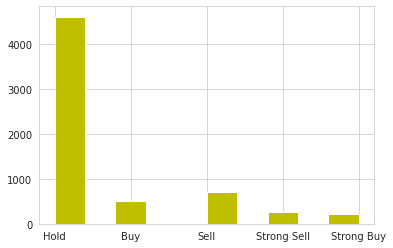

In [183]:
#lets see how class labels are distributed in test data
count=y_test['Recommendation'].value_counts()
print(count)
plt.hist(y_test['Recommendation'],facecolor='y')
plt.show()

In [184]:
y_test.shape

(6295, 1)

In [185]:
#test
from sklearn.metrics import multilabel_confusion_matrix
multilabel_confusion_matrix(y_test_array,X_test_predict_gbdt ,
                          labels=["Buy", "Hold", "Sell","Strong Buy","Strong Sell"])

array([[[5619,  179],
        [  85,  412]],

       [[1402,  278],
        [ 767, 3848]],

       [[5144,  436],
        [ 169,  546]],

       [[5983,  100],
        [  33,  179]],

       [[5947,   92],
        [  31,  225]]])

#**Conclusion of Confusion Matrix(Test)**
Total test data we have (6295 rows)
(RBS MEANS RULE BASED SYSTEM)

Buy(497 rows in test data)
1. 412 times when rule based system is giving buy signal, ml model is also giving buy signal,(TRUE POSITIVE),it means TRUE POSITIVE RATE is 82.8(411/497), it simply means that 82.8% of rows were predicted right by the model which were actually BUY and model predicted them as BUY.

2. 85 times when rule based system is giving Buy signal, ml model is giving Not Buy signal(FALSE NEGATIVE),it means false negative rate is 17.1%(85/497), it simply means that around 17% of rows were predicted wrong by the model which were actually BUY but model predcited them as NOT BUY.


3. 5619 times when RBS is  giving NOT Buy signal, ml model is also giving Not Buy signal(TRUE NEGATIVE),it means TRUE NEGATIVE rate is 96.9%(5619/(5619+179), it means 96.9% rows were predicted right by the model which were actually NOT BUY and model predicted them as Not BUY.

4.  179 times when RBS is giving NOT Buy signal, ml model is giving Buy signal(FALSE POSITIVE), it means False postive rate is 3%, (179/(5619+179)),only 3% rows were predicted wrong by the model which were actually NOT BUY but model predicted it as a BUY.


---
Sell(715 rows in test data)
1. 546 times when rule based system is giving Sell signal, ml model is also giving Sell signal.(TRUE POSITIVES),76.3%(546/715) of rows were predicted right by the model which were actually SELL and model predicted them as SELL.

2. 169 times when rule based system is giving Sell signal, ml model is giving Not Sell signal(FALSE NEGATIVE), it means 23.6%(169/715) of rows were predcited wrong by the model which were actually SELL but model predicted it as NOT SELL.

3. 5144 times when RBS is  giving NOT Sell signal, ml model is also giving Not Sell signal(TRUE NEGATIVE), 92.1%(5144/(5144+436)) of rows were predicted right by the model, which were actually NOT SELL and model predicted them as NOT SELL.

4. 436 times when RBS is giving NOT Sell signal, ml model is giving Sell signal(FALSE POSITIVE)
8% of rows were predicted wrong by the model which were actually NOT SELL but model predicted as SELL.

---
STRONG BUY(212 rows in test data)
1. 179 times when rule based system is giving STRONG Buy signal, ml model is also giving Strong Buy signal.(TRUE POSITIVES), it means around 84.4% (179/212)rows were predicted right by the model which were actually STRONG BUY and model predicted them STRONG BUY.

2. 33 times when rule based system is giving Strong Buy signal, ml model is giving Not Strong Buy signal(FALSE NEGATIVE), it means around 15.5% of the rows were predicted wrong by the model which were actually STRONG BUY buy model predicted them as NOT STRONG BUY.

3. 5983 time when RBS is  giving NOT Strong Buy signal, ml model is also giving Not Strong Buy signal(TRUE NEGATIVE), 98.3% (5983/(5983+100)) of rows were predicted right by the model which were actually NOT STRONG BUY and model predicted them as NOT STRONG BUY.

4.  100 times when RBS is giving Strong NOT Buy signal, ml model is giving Strong Buy signal(FALSE POSITIVE),it means around 1.7% of rows were wrongly predicted by model which were actually NOT STRONG BUY AND model predicted them as STRONG BUY.


---

STRONG SELL(256 rows in test data)
1. 234 times when rule based system is giving STRONG SELL signal, ml model is also giving Strong SELL signal.(TRUE POSITIVES).

2. 32 times when rule based system is giving Strong SELL signal, ml model is giving Not Strong SELL signal(FALSE NEGATIVE).

3. 7745 time when RBS is  giving NOT Strong SELL signal, ml model is also giving Not Strong SELL signal(TRUE NEGATIVE).

4.  109 times when RBS is giving Strong NOT SELL signal, ml model is giving Strong SELL signal(FALSE POSITIVE).

#**EXPLAINABLE AI/ML**
This is a very recent field of research, Everytime we predict something using Machine Learning, it's very important to know the reasoning behind that particular predictions specially in medical and finance industry where high risks are involved.

Reasoning behind a particular predictions gives us a understanding of how and why a Machine Learning model is predicting a particular result.

Ther are 2 famous algorithms which works fine for this task:

1. Lime 
2. Shap

The best part about these algorithms are that they dont care about the ML model you are working with, you can give any Ml model and these techniques will explain the reasoning behind a particular prediction.

We will use Lime for this project.

In [188]:

import lime
from lime import lime_tabular
predict_gbdt=lambda x:model.predict_proba(x)



In [189]:
#BUY
explainer=lime_tabular.LimeTabularExplainer(
           training_data=np.array(X_train_array),
           feature_names=X_train.columns,
            class_names=['Buy','Hold','Sell','Strong Buy','Strong Sell'],
            mode='classification')

In [190]:
exp=explainer.explain_instance(
data_row=X_test_array[2],
predict_fn=gbdt_modelcw.predict_proba)

exp.show_in_notebook(show_table=True)

In [191]:
#HOLD
exp=explainer.explain_instance(
data_row=X_test_array[0],
predict_fn=gbdt_modelcw.predict_proba)

exp.show_in_notebook(show_table=True)

In [192]:
#SELL
exp=explainer.explain_instance(
data_row=X_test_array[3],
predict_fn=gbdt_modelcw.predict_proba)

exp.show_in_notebook(show_table=True)

In [193]:
#STRONG BUY
exp=explainer.explain_instance(
data_row=X_test_array[8],
predict_fn=gbdt_modelcw.predict_proba)

exp.show_in_notebook(show_table=True)

In [194]:
#STRONG SELL
exp=explainer.explain_instance(
data_row=X_test_array[6],
predict_fn=gbdt_modelcw.predict_proba)

exp.show_in_notebook(show_table=True)

Now from the results we can see that GBDT works best, it is giving us 84% F1 score on Test data which can be improved.

In [218]:
from prettytable import PrettyTable
columns=(["ALGORITHM", "F1_SCORE_MICRO","F1_SCORE_MACRO"])
myTable = PrettyTable()
myTable.add_column(columns[0], ["Logistic Regression with smote","Logistic Regression","Random Forest with smote", "GBDT with smote" ,"Random Forest", "GBDT"])
myTable.add_column(columns[1], [" 48%"," 73.5%","71.61%", "87%", "51.2%","86.6%"])
myTable.add_column(columns[2], ["28.6% ","23.5%","55.7%", "78.5%","51%","76%"])

print(myTable)



+--------------------------------+----------------+----------------+
|           ALGORITHM            | F1_SCORE_MICRO | F1_SCORE_MACRO |
+--------------------------------+----------------+----------------+
| Logistic Regression with smote |       48%      |     28.6%      |
|      Logistic Regression       |      73.5%     |     23.5%      |
|    Random Forest with smote    |     71.61%     |     55.7%      |
|        GBDT with smote         |      87%       |     78.5%      |
|         Random Forest          |     51.2%      |      51%       |
|              GBDT              |     86.6%      |      76%       |
+--------------------------------+----------------+----------------+


#CONCLUSION
We can see that gbdt with smote is giving us max f1 score but the problem is, it's difficult to trust the model after applying smote because smote had synthetically generated data and we dont know what data smote has generated.

Also gbdt without applying smote technique also giving us the almost same f1 score and in this case we are well aware of data we are using. There is no synthetic data in this.

Finance Machine Learning models shoud be very sensitive to any decision they predict so awareness about the data is very important, wrong prediction can cost money of the users and also Reputation of the ML model gets impacted as well.





---



---



#Retraining of Model

1. We can do retraining every month or every 3 months according to the results of the retraining.

2. Let's say we had extracted data till (1st august 2021) and built  a model over that, now on september 1st 2021, we again will have a data for one month, we will extract this data and will retrain on the whole data(till 1st/september/2021).We can retrain Random Forest, Logistic Regression, GBDT on this data and see how results vary from last trained results.

3. While Retraining we need to follow the same process which we used while training the models except for the data, However if using some feature transformation can improve the results then it is always a good idea.

#VALIDATION

1. Validation of the model can be done by observing  the rule based system.

2. Evaluation Metric like F1 score, Multi-Label Confusion Matrix can also help in validating the models.

3. Techniques like Lime and Shap can help us in Explaining the results of models.

---



---



#**END OF THE PROJECT**